## Exploratory Data Analysis

### Dataset: Aspiring Minds Employability Outcomes 2015

### Importing Libararies

In [1]:
import pandas as pd # for data handling
import numpy as np # for numerical calculation

import seaborn as sns  # for data visulisation
import matplotlib.pyplot as plt  # for data visulisation
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

In [2]:
from scipy.stats import norm #statistical operation
from sklearn.preprocessing import StandardScaler # for standardized column

### Importing the data

In [3]:
df = pd.read_excel("aspiring_minds_employability_outcomes_2015.xlsx")

<h2>Dataset Description </h2><br>

>The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines. The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature. The dataset contains a unique identifier for each candidate. 

In [4]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [5]:
df.tail()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
3993,train,47916,280000,2011-10-01,2012-10-01 00:00:00,software engineer,New Delhi,m,1987-04-15,52.09,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,100000,2013-07-01,2013-07-01 00:00:00,technical writer,Hyderabad,f,1992-08-27,90.00,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,320000,2013-07-01,present,associate software engineer,Bangalore,m,1991-07-03,81.86,...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,200000,2014-07-01,2015-01-01 00:00:00,software developer,Asifabadbanglore,f,1992-03-20,78.72,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943
3997,train,324966,400000,2013-02-01,present,senior systems engineer,Chennai,f,1991-02-26,70.60,...,-1,-1,-1,-1,-1,-1.1128,-0.2793,-0.6343,1.32553,-0.6035


### Set Option to View all Rows and Columns

In [6]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [7]:
df

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.30,"board ofsecondary education,ap",2007,95.80,"board of intermediate education,ap",1141,2,B.Tech/B.E.,computer engineering,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.40,cbse,2007,85.00,cbse,5807,2,B.Tech/B.E.,electronics and communication engineering,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.00,cbse,2010,68.20,cbse,64,2,B.Tech/B.E.,information technology,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.60,cbse,2007,83.60,cbse,6920,1,B.Tech/B.E.,computer engineering,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.00,cbse,2008,76.80,cbse,11368,2,B.Tech/B.E.,electronics and communication engineering,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
5,train,1027655,300000,2014-06-01,present,system engineer,Hyderabad,m,1992-07-02,89.92,state board,2010,87.00,state board,5086,2,B.Tech/B.E.,electronics and communication engineering,76.32,5086,0,Karnataka,2014,560,555,620,-1.000000,645,-1,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608
6,train,947847,300000,2014-08-01,2015-05-01 00:00:00,java software engineer,Banglore,m,1993-02-01,86.08,state board,2010,67.50,state board,314,2,B.Tech/B.E.,computer science & engineering,72.98,314,1,Karnataka,2014,590,435,380,0.356536,405,-1,346,-1,-1,-1,-1,1.7081,-0.1054,-1.0379,-2.00920,-1.0872
7,train,912934,400000,2014-07-01,2015-07-01 00:00:00,mechanical engineer,Bangalore,m,1992-05-27,92.00,cbse,2010,91.00,cbse,1757,1,B.Tech/B.E.,mechanical engineering,8.58,1757,0,Tamil Nadu,2016,545,555,590,0.829585,-1,-1,-1,469,-1,-1,-1,-0.0154,1.2114,0.0100,0.14590,1.2470
8,train,552574,600000,2013-07-01,present,electrical engineer,Noida,m,1991-09-17,90.00,cbse,2009,91.20,cbse,13,1,B.Tech/B.E.,electronics and electrical engineering,85.03,13,1,Delhi,2013,615,670,530,0.694479,735,366,-1,-1,-1,-1,-1,-0.1590,0.5454,-0.6048,-0.74150,-0.2859
9,train,1203363,230000,2014-07-01,present,project engineer,Kolkata,m,1993-06-13,77.00,cbse,2010,72.20,cbse,8640,2,B.Tech/B.E.,electronics and communication engineering,78.00,8640,1,West Bengal,2014,605,565,545,0.493596,385,324,-1,-1,-1,-1,-1,-1.3080,0.5454,-0.9122,0.90660,0.0973


### Dimensions of the Dataset

In [8]:
df.shape

(3998, 39)

### Concise Summary

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
Unnamed: 0               3998 non-null object
ID                       3998 non-null int64
Salary                   3998 non-null int64
DOJ                      3998 non-null datetime64[ns]
DOL                      3998 non-null object
Designation              3998 non-null object
JobCity                  3998 non-null object
Gender                   3998 non-null object
DOB                      3998 non-null datetime64[ns]
10percentage             3998 non-null float64
10board                  3998 non-null object
12graduation             3998 non-null int64
12percentage             3998 non-null float64
12board                  3998 non-null object
CollegeID                3998 non-null int64
CollegeTier              3998 non-null int64
Degree                   3998 non-null object
Specialization           3998 non-null object
collegeGPA               3998 non-null float64
Colle

### Statistical description of the dataset 

In [14]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,2012.105803,501.649075,501.598799,513.378189,0.510490,353.102801,95.328414,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,31.857271,104.940021,86.783297,122.302332,0.468671,205.355519,158.241218,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,0.000000,180.000000,195.000000,120.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,2012.000000,425.000000,445.000000,430.000000,0.342315,295.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,2013.000000,500.000000,505.000000,515.000000,0.622643,415.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,2014.000000,570.000000,565.000000,595.000000,0.842248,495.000000,233.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,2017.000000,875.000000,795.000000,900.000000,0.999910,840.000000,612.000000,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


### Missing Values in the data

In [15]:
df.isnull().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

#### Conclusion: No missing value in the data

### Columns of the dataset

In [16]:
df.columns

Index(['Unnamed: 0', 'ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity',
       'Gender', 'DOB', '10percentage', '10board', '12graduation',
       '12percentage', '12board', 'CollegeID', 'CollegeTier', 'Degree',
       'Specialization', 'collegeGPA', 'CollegeCityID', 'CollegeCityTier',
       'CollegeState', 'GraduationYear', 'English', 'Logical', 'Quant',
       'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience'],
      dtype='object')

### Checking the types of values in each column

In [13]:
for clm in df.columns:
    print("*"*10,clm,"*"*10)
    print(df[clm].value_counts())
    print("---------------------------\n")

********** Unnamed: 0 **********
train    3998
Name: Unnamed: 0, dtype: int64
---------------------------

********** ID **********
337919     1
831000     1
775902     1
330544     1
700535     1
275243     1
639785     1
215848     1
267047     1
140069     1
240420     1
404256     1
1143583    1
277278     1
918301     1
1063702    1
1057665    1
332563     1
326418     1
664337     1
920332     1
842506     1
54023      1
1172229    1
260866     1
901346     1
602875     1
629498     1
324343     1
203510     1
926517     1
353081     1
918568     1
911998     1
1287037    1
1193240    1
1145718    1
1123185    1
816885     1
1088362    1
1008489    1
1037159    1
60260      1
30706      1
334686     1
469012     1
1211556    1
615097     1
693253     1
121686     1
330576     1
791375     1
244558     1
262989     1
289612     1
1037131    1
920388     1
720961     1
205633     1
731214     1
1233727    1
910069     1
815859     1
669645     1
711342     1
53931      1
582313    

 0.6721    187
-0.0943    182
 0.0973    182
 0.4805    177
 0.2889    174
-0.2859    167
 0.8637    158
-0.6692    145
 1.0554    135
-0.4776    131
-0.2875    124
 0.1864    123
-0.1295    119
 0.3444    110
-0.4455    104
-0.8608     99
 0.0284     96
 0.5024     93
 1.2470     93
-1.0524     91
 0.6603     80
-0.6035     80
-0.7615     76
-0.9194     70
 0.8183     60
 1.4386     55
-1.2440     54
-1.4356     52
-1.2354     45
-1.6273     45
 1.6302     41
-1.0774     40
 0.9763     36
-1.8189     36
 1.1343     25
-2.0105     25
-1.3934     21
-1.5513     21
-2.5853     19
-2.2021     19
-0.0506     18
-0.1690     17
 1.2923     17
-0.6430     16
 1.4502     15
 0.4234     15
 0.5419     15
-1.8673     14
 0.0679     14
 0.3049     13
-0.5245     12
-2.7769     11
-1.7093     11
-2.3937     11
-2.0253     10
 0.8973     10
-0.8799      9
 0.7788      9
-2.1833      8
-0.4060      7
-2.9686      7
-2.3412      5
-3.3518      5
 1.6082      5
 0.5850      4
 1.0158      4
 0.1670   

From the above observation 


* 'jobCity' column is of object type but has -1 values
* '10Board' column is of object type but has 0 values
* '12board' column is of object type but has 0 values

'Designation', 'JobCity', '10board','12board', 'Degree', 'Specialization', 'CollegeState' contains the dupliacte values with same meaning 

Therefore, Data Cleaning and Preprocessing is needed

#### Replacing error value with Null values

In [17]:
df['JobCity'].replace(-1,np.nan,inplace = True)
df['10board'].replace(0,np.nan,inplace = True)
df['12board'].replace(0,np.nan,inplace = True)

#### Checking the Missing Values

In [18]:
df.isnull().sum()

Unnamed: 0                 0
ID                         0
Salary                     0
DOJ                        0
DOL                        0
Designation                0
JobCity                  461
Gender                     0
DOB                        0
10percentage               0
10board                  350
12graduation               0
12percentage               0
12board                  359
CollegeID                  0
CollegeTier                0
Degree                     0
Specialization             0
collegeGPA                 0
CollegeCityID              0
CollegeCityTier            0
CollegeState               0
GraduationYear             0
English                    0
Logical                    0
Quant                      0
Domain                     0
ComputerProgramming        0
ElectronicsAndSemicon      0
ComputerScience            0
MechanicalEngg             0
ElectricalEngg             0
TelecomEngg                0
CivilEngg                  0
conscientiousn

### Drop the Null Values

In [20]:
df.dropna(inplace=True)
df.isnull().sum()

Unnamed: 0               0
ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
n

#### Data Cleaning and Preprocessing of 10Board and 12Board Column

In [22]:
list_10board = []
AP  = ['board of intermediate education,ap','nagpur','state board of secondary education,andhra pradesh', 'ssc board of andrapradesh','ssc-andhra pradesh','andhra pradesh board ssc','school secondary education, andhra pradesh','andhra pradesh state board',  'apssc','state board of secondary education, ap','ap state board','apsche','ap state board for secondary education',"board ofsecondary education,ap",'board of secondary education - andhra pradesh','board of ssc education andhra pradesh','state board of secondary education, andhra pradesh','board of secondary education,andhara pradesh'] 
maharashtra = ['state','maharashtra board','board of ssc','maharashtra state board pune','maharashtra sate board','latur','matric','mhsbse','secondary school of education','nagpur board', 'kolhapur divisional board, maharashtra','msbshse,pune','maharashtra state board of secondary and higher secondary education,pune','pune board','maharashtra state board,pune','state board ','maharastra board', 'sslc board', 'ssc maharashtra board','nashik board', 'maharashtra nasik board','kolhapur','nagpur board,nagpur', 'pune', 'gyan bharati school', 'state boardmp board ','nagpur divisional board','state board of secondary education( ssc)','maharashtra state board for ssc', 'latur board','board of secondaray education', 'aurangabad board','maharashtra state boar of secondary and higher secondary education','nasik',
       'secondary school education', 'state bord','maharashtra','sss pune',"state board",'maharashtra state(latur board)',"ssc",'maharashtra state board','ms board','maharashtra satate board', 'stateboard','sslc','board secondary  education', 'matric board','metric',
       'board of secondary education',  'maharashtra state board of secondary & higher secondary education','maharashtra board, pune','maharashtra state board mumbai divisional board']
karnataka = ['karnataka board of secondary education','karantaka secondary education and examination borad','kseeb(karnataka secondary education examination board)','state(karnataka board)','ksseb','karnataka sslc board bangalore', 'karnataka','state board of karnataka', 'karnataka secondary board','karnataka secondary education','ksbe','sslc,karnataka','karnataka state examination board','karnataka secondary eduction','karnataka secondary education board','karnataka education board (keeb)','karnataka secondary education examination board','karnataka board',"karnataka secondary school of examination", 'karnataka secondory education board','kseb','ksseb(karnataka state board)','karnataka state education examination board', 'kseeb','karnataka state board' , 'karnataka state secondary education board']
cbse = ['certificate of middle years program of ib','cbse[gulf zone]','delhi board','stjosephs girls higher sec school,dindigul','secondary school cerfificate', 'stjoseph of cluny matrhrsecschool,neyveli,cuddalore district',
        'national public school','anglo indian', 'secondary state certificate','stmary higher secondary', 'cgbse','secondary school certificate',  'cbse ','sarada high scchool','cbsc',"stmary's convent inter college",'central board of secondary education, new delhi', 'cbse board',"cbse" ,'central board of secondary education','delhi public school','council for indian school certificate examination',]
MP = ['mpboard','mp', 'mp state board','mpbse','madhya pradesh board','mp-bse',"mp board bhopal",'mp board']
icse = ['uttrakhand board','cgbse raipur', 'cicse','j & k bord','jkbose','cluny','pseb','uttarakhand board','mirza ahmed ali baig','board of intermediate education','kiran english medium high school',"icse" ,'icse board','icse board , new delhi']
bihar = ['bihar board','bihar examination board, patna', 'bsepatna','bsemp','bihar','bseb,patna','bse(board of secondary education)','bihar secondary education board,patna','bseb','bihar school examination board','bse','biharboard', 'bseb, patna', 'bseb patna']
UP = ['up(allahabad)','upbhsie', 'up baord', 'u p','up bord','up board allahabad','uttar pradesh','up board,allahabad','up','up board','uttar pradesh board','upboard','u p board','bright way college, (up board)','up-board','board of high school and intermediate education uttarpradesh']
matriculation= [ 'don bosco maatriculation school','matriculation board','bharathi matriculation school', 'kalaimagal matriculation higher secondary school','matriculation', 'maticulation','holy cross matriculation hr sec school']
Gujarat =['gujarat state board','gsheb','gujarat board','ghseb', 'gseb']
WWb = ['wbbsce','west bengal board of secondary examination (wbbse)','west bengal board of secondary eucation', 'west bengal  board of secondary education','wbbse','state board - west bengal board of secondary education : wbbse','west bengal board of secondary education'] 
orissa = ['board of secendary education orissa','bse, odisha', 'bse,orissa','hse,orissa','board of secondary education,orissa', 'board of secondary education,odisha','board of secondary education (bse) orissa','board of secondary education(bse) orissa','bsc,orissa','bse,odisha','board of secondary education orissa']
Rajasthan = ['board of secondary education rajasthan', 'rajasthan board','board of secondary education, rajasthan','rajasthan board ajmer','state board (jac, ranchi)', 'rajasthan board of secondary education','rbse','rbse,ajmer','secondary education board of rajasthan','rbse (state board)']

jharkhand =['jharkhand accademic council','jharkhand secondary examination board (ranchi)','jseb', 'jharkhand secondary board','jharkhand academic council','jharkhand secondary education board','jharkhand secondary examination board,ranchi','jharkhand acedemic council','jbse,jharkhand']
Assam = ['seba','seba(assam)','jawahar navodaya vidyalaya', 'aisse']
kerala = ['kerala','kerala university', 'kerala state board','education board of kerala']
haryana = ['board of school education harayana','haryana board of school education','hsce','dav public school sec 14', 'board of school education haryana','hse','hse,board']
uttranchal =['uttaranchal state board','uttranchal board','uttaranchal shiksha avam pariksha parishad','ua']
Himmachal = ['himachal pradesh board','state borad hp','hbse', 'hbsc','hsc', 'himachal pradesh board of school education']
TN = ['tamilnadu matriculation board','tn state board', 'sri kannika parameswari highier secondary school, udumalpet', 'tamil nadu state','tamilnadu state board']


In [23]:
#data Cleaning and Preprocessing of 10board
for i in df['10board']:
    if i in AP:
        list_10board.append("SSC_Ap")
    elif i in cbse:
        list_10board.append("CBSE")
    elif i in maharashtra:
        list_10board.append("SSC")
    elif i in MP:
        list_10board.append("SSC_MP")
    elif i in karnataka:
        list_10board.append("SSC_Karnataka")
    elif i in icse:
        list_10board.append('ICSE')
    elif i in bihar:
        list_10board.append( 'SSC_Bihar')
    elif i in  UP:
        list_10board.append("SSC_UP")
    elif i in matriculation:
        list_10board.append('MatriCulation')
    elif i in  Gujarat :
        list_10board.append("SSC_Gujarat")
    elif i in  WWb:
        list_10board.append("SSC_WWB")
    elif i in orissa:
        list_10board.append("SSC_Orissa")
    elif i in Rajasthan:
        list_10board.append("SCC_Rajasthan")
    elif i in jharkhand:
        list_10board.append("SSC_Jharkhand")
    elif i in Assam:
        list_10board.append("SSC_Assam")
    elif i in kerala:
        list_10board.append("SCC_kerala")
    elif i in haryana:
        list_10board.append("SSC_haryana")
    elif i in uttranchal:
        list_10board.append("SSC_uttranchal")
    elif i in Himmachal:
        list_10board.append("SSC_Himmachal")
    elif i in TN:
        list_10board.append("SSC_TN")
    else:
        list_10board.append("CBSE")
        

In [24]:
#data Cleaning and Preprocessing of 12board
list_12board = []
for i in df['12board']:
    if i in AP:
        list_12board.append("HSC_Ap")
    elif i in cbse:
        list_12board.append("CBSE")
    elif i in maharashtra:
        list_12board.append("HSC")
    elif i in MP:
        list_12board.append("HSC_MP")
    elif i in karnataka:
        list_12board.append("HSC_Karnataka")
    elif i in icse:
        list_12board.append('ICSE')
    elif i in bihar:
        list_12board.append('HSC_Bihar')
    elif i in  UP:
        list_12board.append("HSC_UP")
    elif i in matriculation:
        list_12board.append('MatriCulation')
    elif i in  Gujarat :
        list_12board.append("HSC_Gujarat")
    elif i in  WWb:
        list_12board.append("HSC_WWB")
    elif i in orissa:
        list_12board.append("HSC_Orissa")
    elif i in Rajasthan:
        list_12board.append("HCC_Rajasthan")
    elif i in jharkhand:
        list_12board.append("HSC_Jharkhand")
    elif i in Assam:
        lidt_12board.append("HSC_Assam")
    elif i in kerala:
        list_12board.append("HCC_kerala")
    elif i in haryana:
        list_12board.append("HSC_haryana")
    elif i in uttranchal:
        list_12board.append("HSC_uttranchal")
    elif i in Himmachal:
        list_12board.append("HSC_Himmachal")
    elif i in TN:
        list_12board.append("HSC_TN")
    else:
        list_12board.append("CBSE")
        

In [25]:
df['10board'] = list_10board
df['12board'] = list_12board

In [26]:
df['Specialization'].unique()

array(['computer engineering',
       'electronics and communication engineering',
       'information technology', 'computer science & engineering',
       'mechanical engineering', 'electronics and electrical engineering',
       'electronics & telecommunications',
       'instrumentation and control engineering', 'computer application',
       'electronics and computer engineering', 'electrical engineering',
       'applied electronics and instrumentation',
       'electronics & instrumentation eng',
       'information science engineering', 'civil engineering',
       'mechanical and automation',
       'control and instrumentation engineering',
       'metallurgical engineering',
       'electronics and instrumentation engineering',
       'ceramic engineering', 'aeronautical engineering',
       'electronics engineering', 'chemical engineering', 'other',
       'biotechnology', 'embedded systems technology',
       'computer science and technology', 'mechatronics',
       'electr

In [27]:
Specialization = []
CSE = [ 'computer science & engineering','computer application','electronics and computer engineering','computer engineering','computer science','computer and communication engineering', 'computer science and technology']
IT = [ 'information technology', 'information science engineering','information & communication technology', 'information science']
Entc = [ 'electronics and communication engineering','electronics & telecommunications','telecommunication engineering']
Mech = ['mechanical engineering','mechanical and automation','mechatronics','mechanical & production engineering']
elect = ['applied electronics and instrumentation','electronics & instrumentation eng','electronics','electronics engineering', 'electronics and instrumentation engineering']
BE = ['biomedical engineering','biotechnology']
IndE = [ 'industrial & management engineering', 'industrial engineering','industrial & production engineering']
inst = [ 'instrumentation and control engineering', 'instrumentation engineering']
power = ['power systems and automation','polymer technology','embedded systems technology', 'control and instrumentation engineering']
electric =['electronics and electrical engineering','electrical engineering','electrical and power engineering']
other = ['internal combustion engine','chemical engineering','ceramic engineering','other','aeronautical engineering','metallurgical engineering','civil engineering','automobile/automotive engineering']


In [28]:
for i in df['Specialization']:
    if i in CSE:
        Specialization.append("CSE")
    elif i in IT:
        Specialization.append("IT")
    elif i in Entc:
        Specialization.append("ENTC")
    elif i in Mech:
        Specialization.append("Mech")
    elif i in elect:
        Specialization.append("Electronics")
    elif i in BE:
        Specialization.append("Bio Eng")
    elif i in IndE:
        Specialization.append("Ind Eng")
    elif i in inst:
        Specialization.append("Instrumentation")
    elif i in power:
        Specialization.append("Power")
    elif i in electric:
        Specialization.append("Electric")
    elif i in other:
        Specialization.append("Other")
    else:
        Specialization.append("Other")

In [29]:
df['Specialization'] = Specialization

In [30]:
df.head()

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000,2012-06-01,present,senior quality engineer,Bangalore,f,1990-02-19,84.3,SSC_Ap,2007,95.8,HSC_Ap,1141,2,B.Tech/B.E.,CSE,78.00,1141,0,Andhra Pradesh,2011,515,585,525,0.635979,445,-1,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000,2013-09-01,present,assistant manager,Indore,m,1989-10-04,85.4,CBSE,2007,85.0,CBSE,5807,2,B.Tech/B.E.,ENTC,70.06,5807,0,Madhya Pradesh,2012,695,610,780,0.960603,-1,466,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000,2014-06-01,present,systems engineer,Chennai,f,1992-08-03,85.0,CBSE,2010,68.2,CBSE,64,2,B.Tech/B.E.,IT,70.00,64,0,Uttar Pradesh,2014,615,545,370,0.450877,395,-1,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000,2011-07-01,present,senior software engineer,Gurgaon,m,1989-12-05,85.6,CBSE,2007,83.6,CBSE,6920,1,B.Tech/B.E.,CSE,74.64,6920,1,Delhi,2011,635,585,625,0.974396,615,-1,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000,2014-03-01,2015-03-01 00:00:00,get,Manesar,m,1991-02-27,78.0,CBSE,2008,76.8,CBSE,11368,2,B.Tech/B.E.,ENTC,73.90,11368,0,Uttar Pradesh,2012,545,625,465,0.124502,-1,233,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


### Dropping the Unknown column

In [31]:
df.drop("Unnamed: 0",axis = 1,inplace = True)

## Univariate Analysis

#### Checking the outlier in the dataset

In [32]:
data = ['Salary','10percentage','12graduation','12percentage','collegeGPA','GraduationYear','English','Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']

In [33]:
def box_plot_wiskers(feature):
    sns.set_style('whitegrid')
    out_marker = dict(markerfacecolor='red',markeredgecolor = 'black', marker='o', markersize = 12)
    plt.figure(figsize=(15,5))
    plt.title(feature ,fontsize = 20) 
    plt.xlabel(feature , fontsize = 15)  
    

    
    boxplot = sns.boxplot(df[feature],color='yellow',
                          showmeans=True,  
                          notch = True,
                          flierprops=out_marker,
                          meanprops={ "marker":"o",
                                    "markerfacecolor":"red", 
                                    "markeredgecolor":"black",
                                    "markersize":"8"})
   

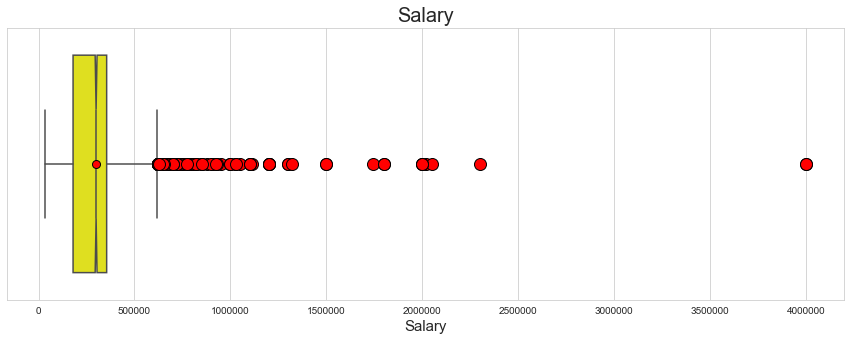

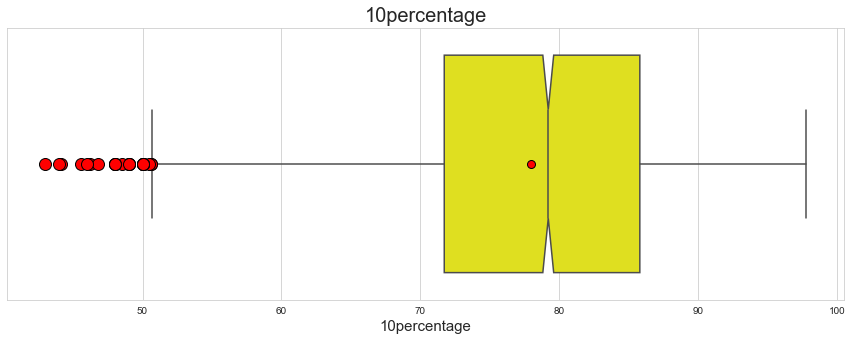

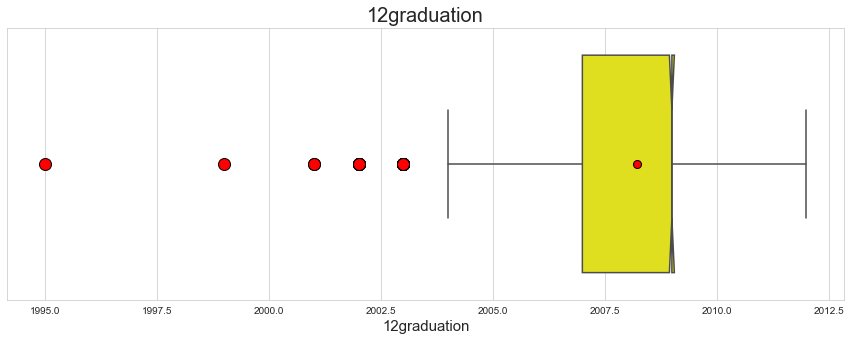

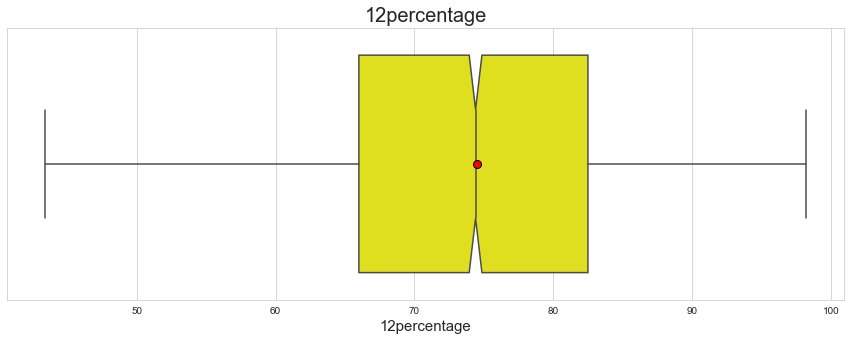

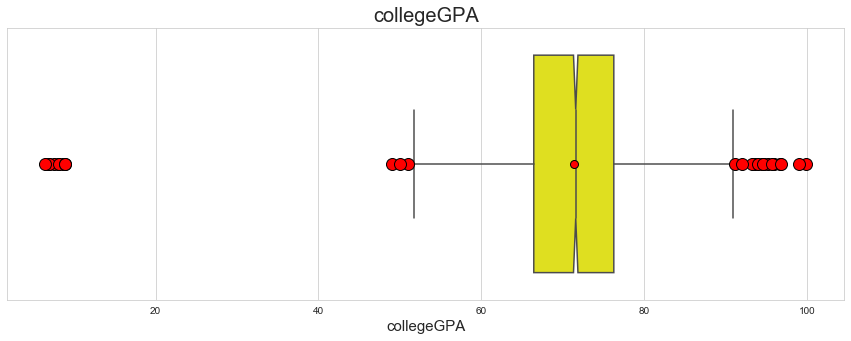

...

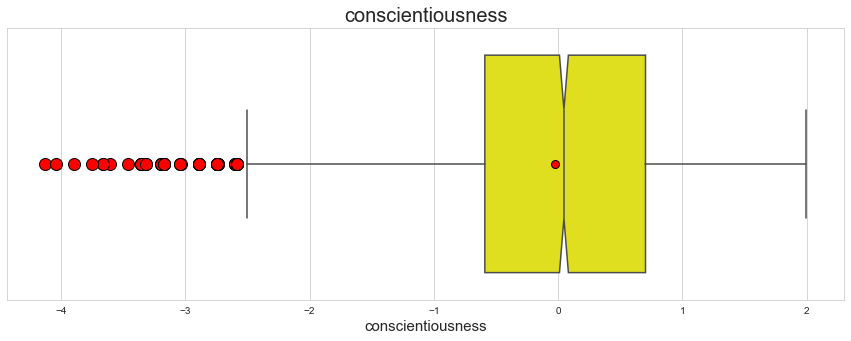

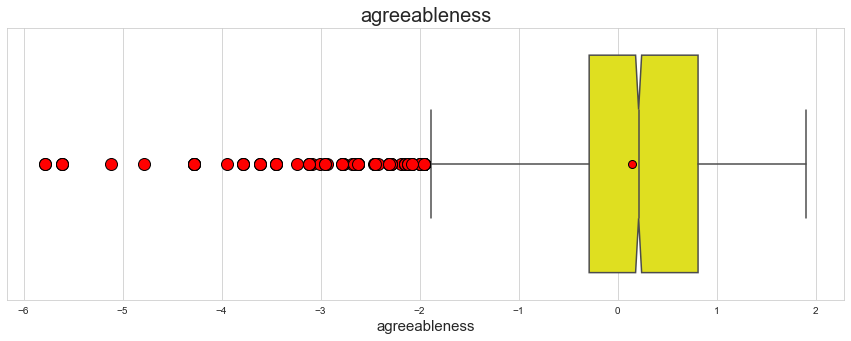

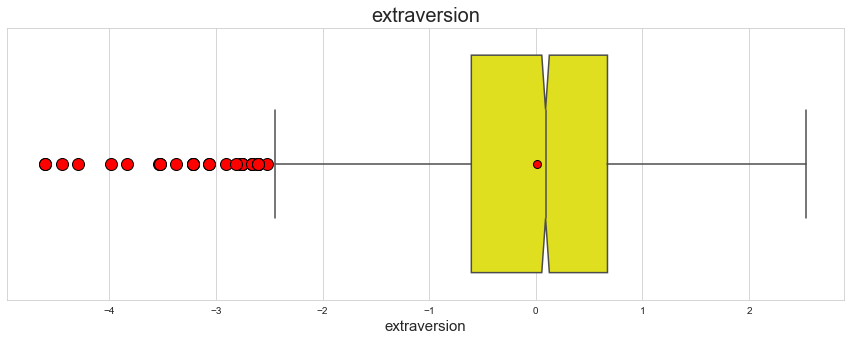

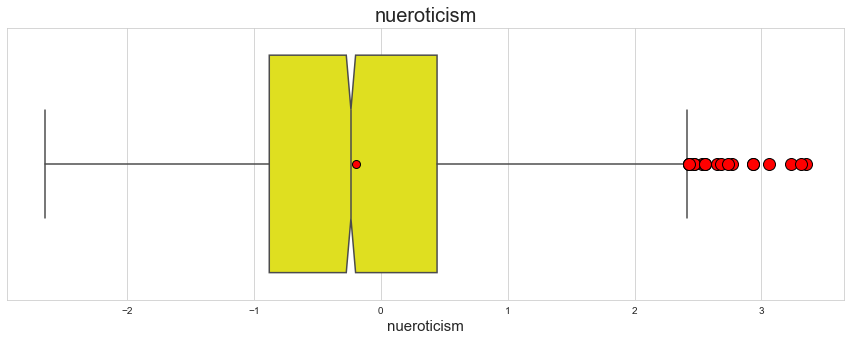

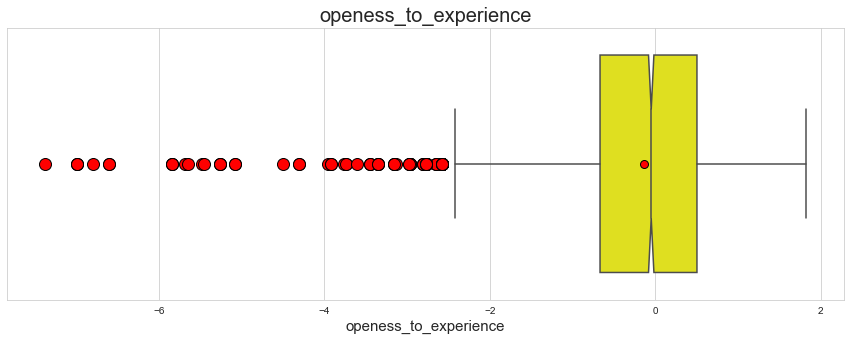

In [34]:
for clm in data:
    box_plot_wiskers(clm)
    

#### Check the number of outlier in each numerical Column

In [35]:
for i in data:
    Q1,Q3 = np.quantile(df[i],[0.25,0.75])
    IQR = Q3-Q1
    lower_bound = Q1 - (1.5*IQR)
    if lower_bound < 0:  # as in whole dataset there is no -ve value hence we set lowerbound to 0
        lower_bound=0
    upper_bound = Q3 + (1.5*IQR)
    print(i)
    print('Lower Bound =',np.round(lower_bound,2),' Upper Bound =',np.round(upper_bound,2))
    print('min value =',df[i].min(), ' max value =', df[i].max())

    if df[i].min() < lower_bound:
        print('negative Outliers',len(df[(df[i]<lower_bound)]))
    
    if df[i].max() > upper_bound:
        print('positive Outliers', len(df[(df[i]>upper_bound)]))  
    
    print('='*50)

Salary
Lower Bound = 0  Upper Bound = 617500.0
min value = 35000  max value = 4000000
positive Outliers 111
10percentage
Lower Bound = 50.6  Upper Bound = 106.9
min value = 43.0  max value = 97.76
negative Outliers 25
12graduation
Lower Bound = 2004.0  Upper Bound = 2012.0
min value = 1995  max value = 2012
negative Outliers 28
12percentage
Lower Bound = 41.27  Upper Bound = 107.22
min value = 43.42  max value = 98.2
collegeGPA
Lower Bound = 51.72  Upper Bound = 91.05
min value = 6.45  max value = 99.93
negative Outliers 13
positive Outliers 15
GraduationYear
Lower Bound = 2009.0  Upper Bound = 2017.0
min value = 0  max value = 2017
negative Outliers 2
English
Lower Bound = 212.5  Upper Bound = 792.5
min value = 180  max value = 830
negative Outliers 1
positive Outliers 7
Logical
Lower Bound = 265.0  Upper Bound = 745.0
min value = 195  max value = 795
negative Outliers 12
positive Outliers 1
Quant
Lower Bound = 182.5  Upper Bound = 842.5
min value = 120  max value = 900
negative Outli

#### Check the Probability Density Function and plot the Histrogram 

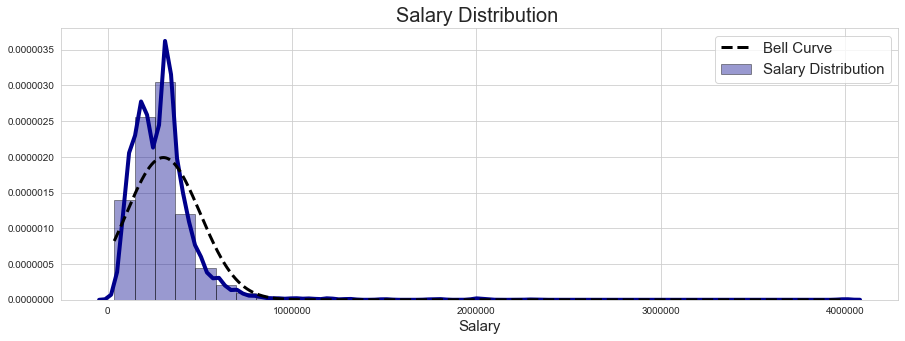

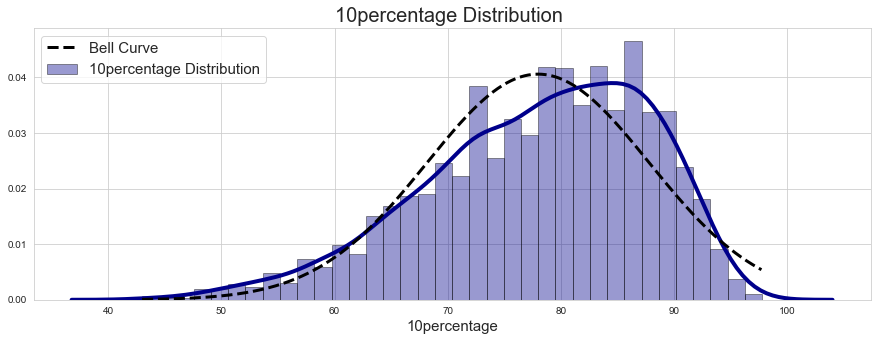

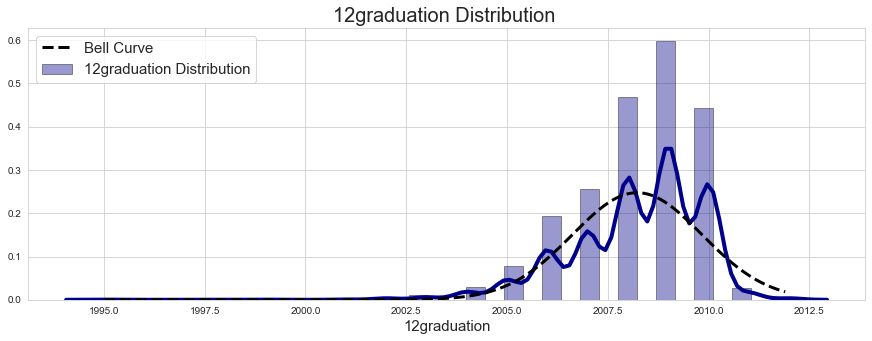

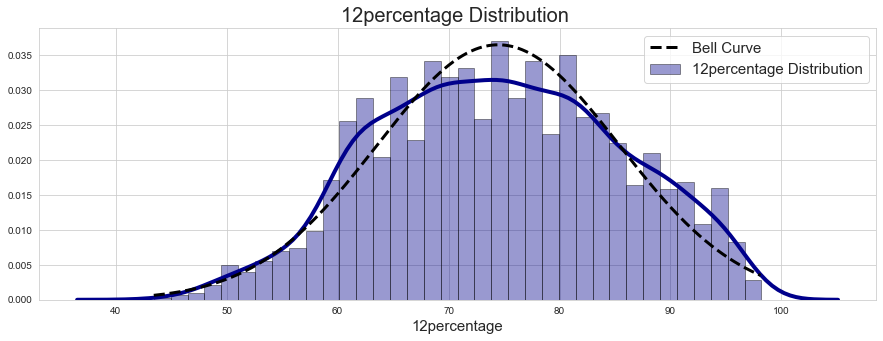

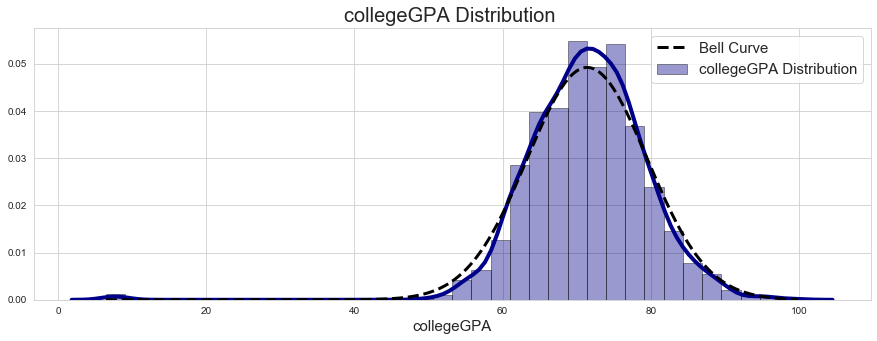

...

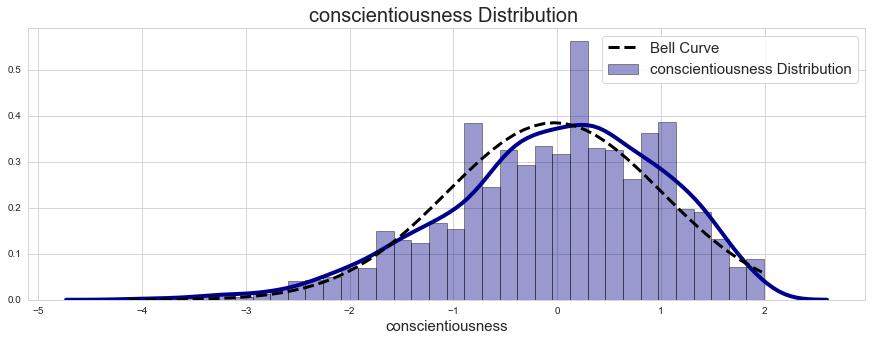

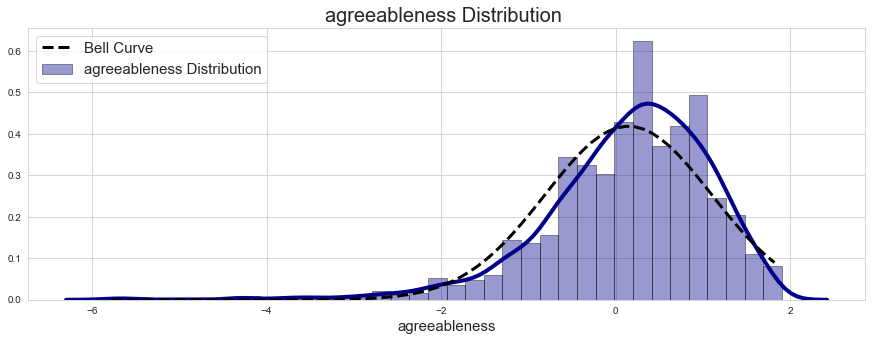

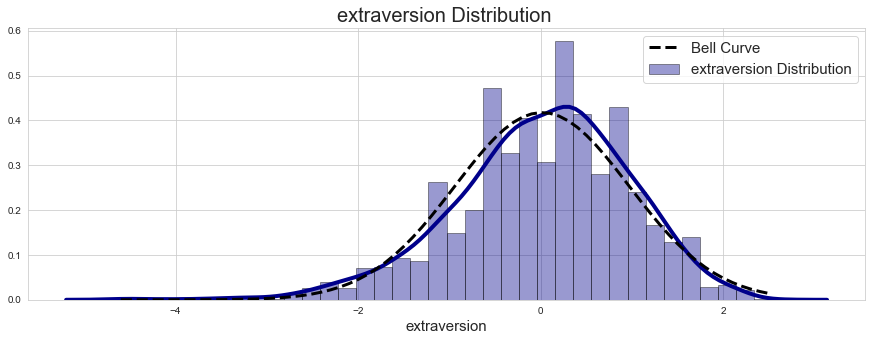

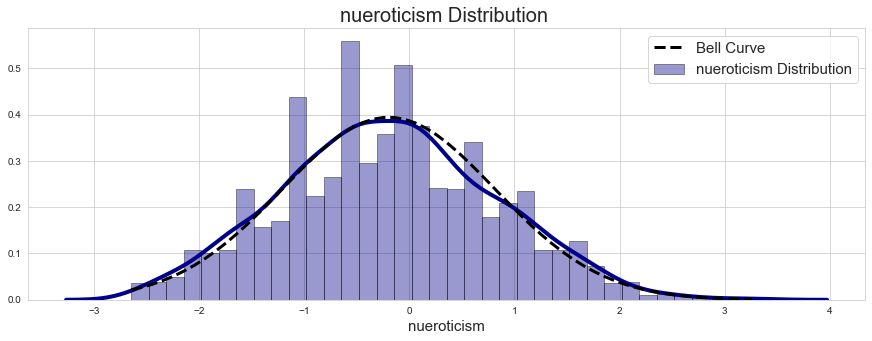

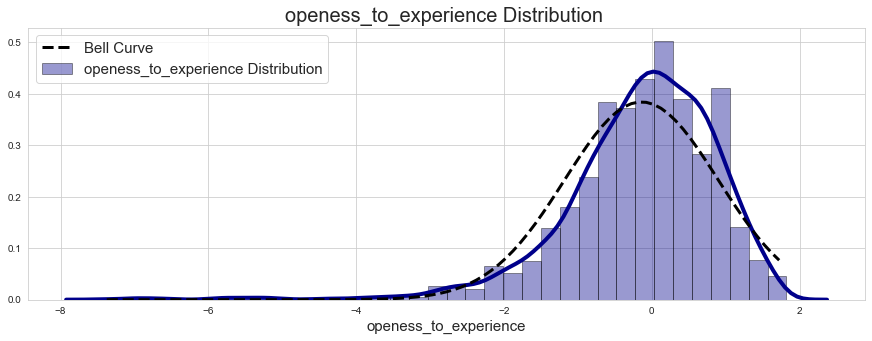

In [38]:
for clm in data:    
    sns.set_style('whitegrid')    
    plt.figure(figsize=(15,5))
    plt.title(clm+' Distribution ',fontsize = 20) 
    plt.xlabel(clm , fontsize = 15) 
    # Density Plot and Histogram of all arrival delays
    sns.distplot(df[clm], hist=True, kde=True, 
             bins=int(180/5), color = 'darkblue', 
             hist_kws={'edgecolor':'black'},
             kde_kws={'linewidth': 4},label=clm+' Distribution')
    rang = np.arange(df[clm].min(),df[clm].max(),0.1)
    plt.plot(rang, norm.pdf(rang,df[clm].mean(),df[clm].std()),color='black', ls='--',lw =3,label = 'Bell Curve')
    plt.legend(fontsize= 15)

### Plot the value count in the column

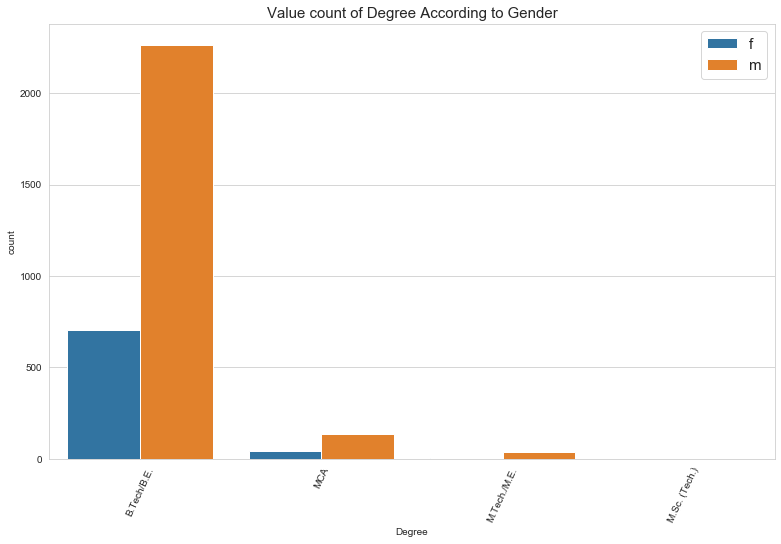

In [39]:
plt.figure(figsize = (13,8))
sns.countplot(x='Degree',hue = "Gender", data = df)
plt.xticks(rotation=65)
plt.title("Value count of Degree According to Gender",fontsize= 15)
plt.legend(fontsize= 15)
plt.show()

#### B.Tech/B.E has Highest value count and 'male' category has Highest ratio compared to 'female' category

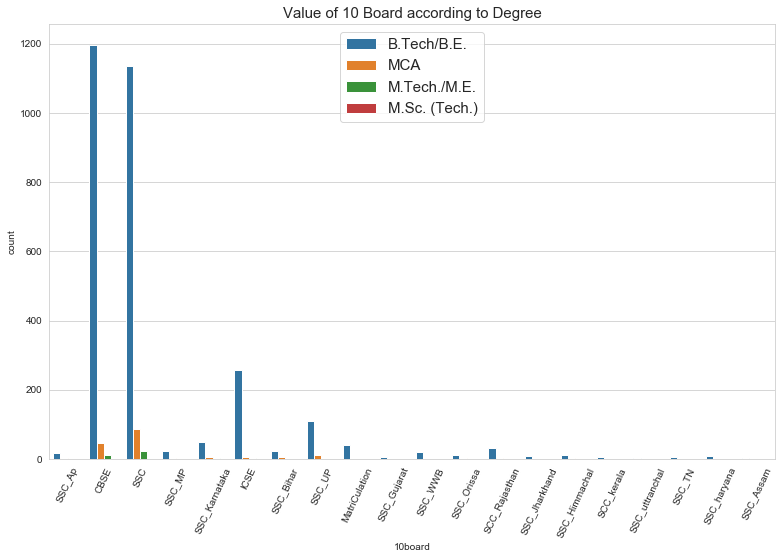

In [40]:
plt.figure(figsize = (13,8))
sns.countplot(x = "10board",hue = "Degree", data = df)
plt.xticks(rotation=65)
plt.title("Value of 10 Board according to Degree",fontsize= 15)
plt.legend(fontsize= 15)
plt.show()

#### CBSE and SSC has Highest value count and B.Tech/B.E has highest ratio as compared to other 

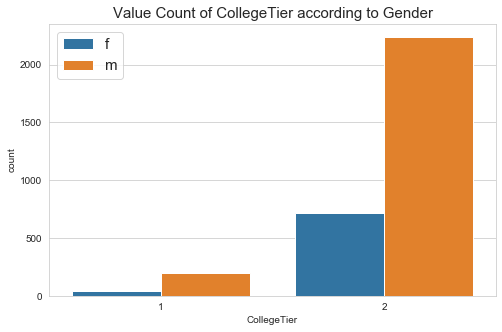

In [41]:
plt.figure(figsize = (8,5))
sns.countplot(x = "CollegeTier",hue = "Gender",data = df )
plt.xticks(rotation=0)
plt.title("Value Count of CollegeTier according to Gender",fontsize= 15)
plt.legend(fontsize= 15)
plt.show()


### Understanding the probability of each numerical column

In [42]:
for clm in df.select_dtypes(include=['int64','float64']).columns:
    totalprobs = str(round(df.groupby([clm]).size().div(len(df)).sum(),1))
    prob =  df.groupby([clm]).size().div(len(df))
    print("="*20,clm,"="*20)
    print(prob)
    print("{} :: Total Probability :- {}".format(clm,totalprobs))
    

==================== ID ====================
ID
11244      0.000313
16037      0.000313
16400      0.000313
17126      0.000313
21229      0.000313
29042      0.000313
29054      0.000313
29161      0.000313
30101      0.000313
30122      0.000313
30142      0.000313
30706      0.000313
30739      0.000313
31330      0.000313
32034      0.000313
32133      0.000313
33117      0.000313
33169      0.000313
33747      0.000313
33947      0.000313
34472      0.000313
34551      0.000313
34990      0.000313
35122      0.000313
35248      0.000313
35249      0.000313
35275      0.000313
35327      0.000313
35346      0.000313
35392      0.000313
35408      0.000313
35694      0.000313
36232      0.000313
36296      0.000313
36759      0.000313
36817      0.000313
38032      0.000313
38162      0.000313
38335      0.000313
38441      0.000313
40772      0.000313
41012      0.000313
41147      0.000313
41579      0.000313
42232      0.000313
42418      0.000313
42849      0.000313
42876      0

### Plotting the Probability of some Numerical column

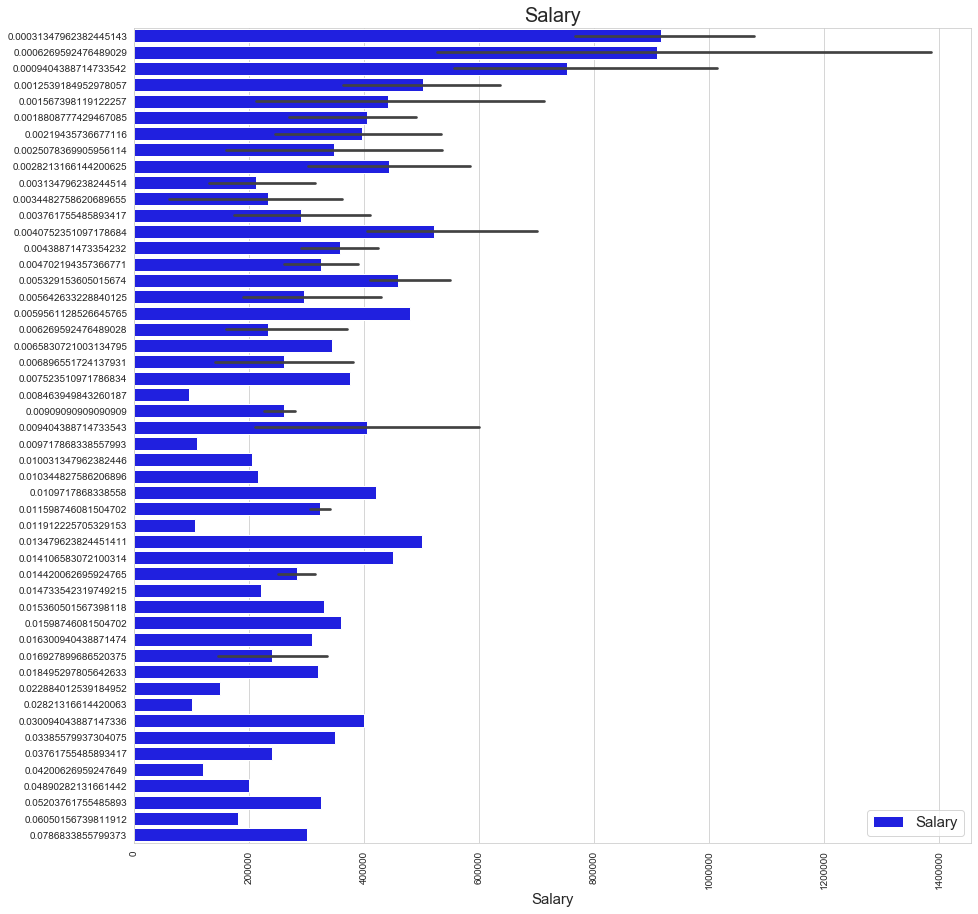

In [43]:
plt.figure(figsize=(15,15))
plt.title("Salary",fontsize = 20) 
plt.xlabel("Salary" , fontsize = 15)
probabilities = df["Salary"].value_counts(normalize=True)    
sns.barplot(probabilities.index, probabilities.values, color='blue',label = "Salary",orient= "h" )
plt.legend(fontsize= 15)
plt.xticks(rotation=90)
plt.show()

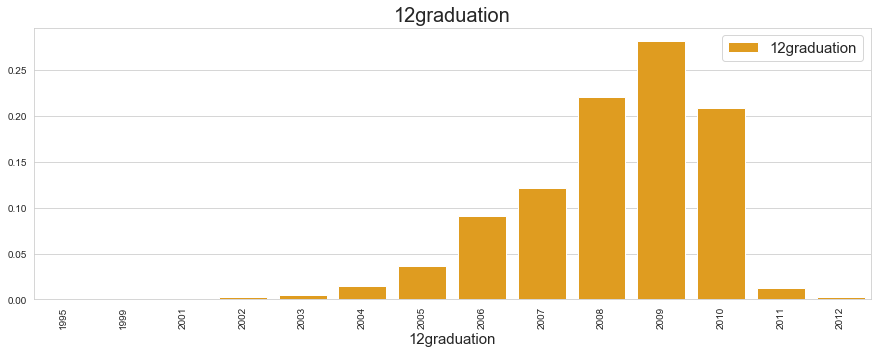

In [44]:
plt.figure(figsize=(15,5))
plt.title("12graduation",fontsize = 20) 
plt.xlabel("12graduation" , fontsize = 15)
probabilities = df["12graduation"].value_counts(normalize=True)    
sns.barplot(probabilities.index, probabilities.values, color='orange',label = "12graduation" )
plt.legend(fontsize= 15)
plt.xticks(rotation=90)
plt.show()

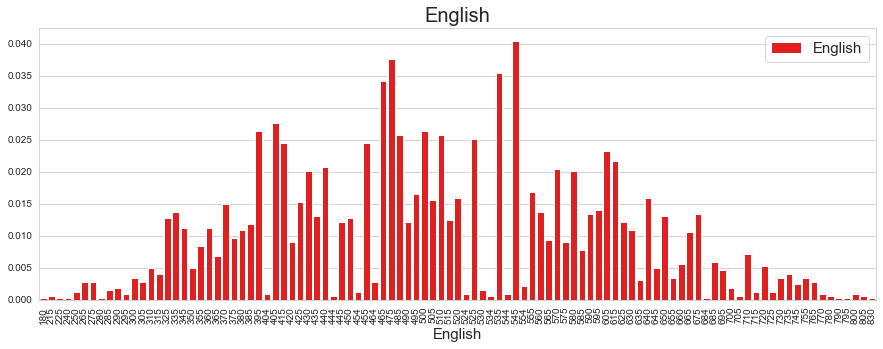

In [45]:
plt.figure(figsize=(15,5))
plt.title("English",fontsize = 20) 
plt.xlabel("English" , fontsize = 15)
probabilities = df["English"].value_counts(normalize=True)    
sns.barplot(probabilities.index, probabilities.values, color='red',label = "English" )
plt.legend(fontsize= 15)
plt.xticks(rotation=90)
plt.show()

### Understanding the Probability in each Categorical Column

In [46]:
for clm in df.select_dtypes(include=['object']).columns:
    totalprobs = str(round(df.groupby([clm]).size().div(len(df)).sum(),1))
    prob =  df.groupby([clm]).size().div(len(df))
    print("="*20,clm,"="*20)
    print(prob)
    print("{} :: Total Probability :- {}".format(clm,totalprobs))

==================== DOL ====================
DOL
2009-06-01 00:00:00    0.000313
2010-02-01 00:00:00    0.000313
2010-08-01 00:00:00    0.000627
2010-10-01 00:00:00    0.000313
2011-01-01 00:00:00    0.000627
2011-02-01 00:00:00    0.000313
2011-03-01 00:00:00    0.000627
2011-04-01 00:00:00    0.000627
2011-05-01 00:00:00    0.000627
2011-06-01 00:00:00    0.001567
2011-07-01 00:00:00    0.000627
2011-08-01 00:00:00    0.000313
2011-09-01 00:00:00    0.000313
2011-10-01 00:00:00    0.000313
2011-11-01 00:00:00    0.001254
2011-12-01 00:00:00    0.001567
2012-01-01 00:00:00    0.002508
2012-02-01 00:00:00    0.001567
2012-03-01 00:00:00    0.001567
2012-04-01 00:00:00    0.001881
2012-05-01 00:00:00    0.000940
2012-06-01 00:00:00    0.003448
2012-07-01 00:00:00    0.003448
2012-08-01 00:00:00    0.003448
2012-09-01 00:00:00    0.002508
2012-10-01 00:00:00    0.001881
2012-11-01 00:00:00    0.002821
2012-12-01 00:00:00    0.001254
2013-01-01 00:00:00    0.004702
2013-02-01 00:00:00   

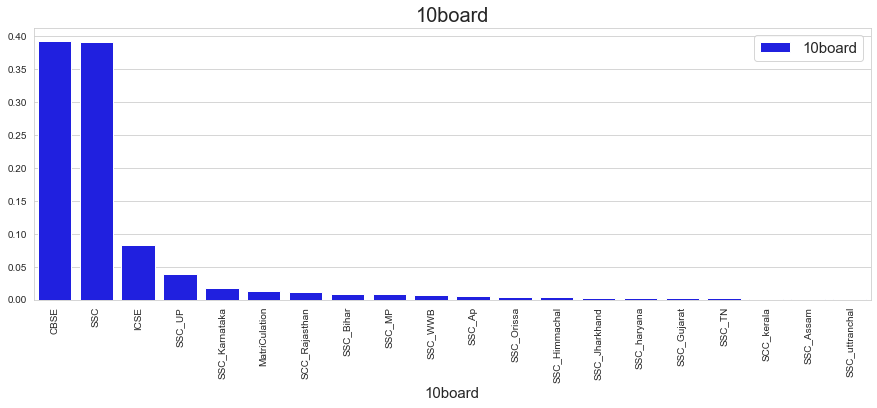

In [47]:
plt.figure(figsize=(15,5))
plt.title("10board",fontsize = 20) 
plt.xlabel("10board" , fontsize = 15)
probabilities = df["10board"].value_counts(normalize=True)    
sns.barplot(probabilities.index, probabilities.values, color='blue',label = "10board" )
plt.legend(fontsize= 15)
plt.xticks(rotation=90)
plt.show()

##  Bivariate Analysis 

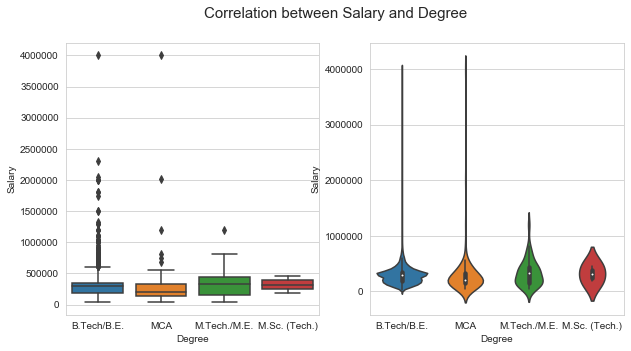

In [48]:
plt.figure(figsize=(10,5))
plt.suptitle("Correlation between Salary and Degree",fontsize=15)
plt.subplot(1,2,1)
sns.boxplot(x="Degree", y="Salary", data=df)
plt.xlabel('Degree',fontsize=10)
plt.ylabel("Salary",fontsize=10)
plt.subplot(1,2,2)
sns.violinplot(x="Degree", y="Salary", data=df)
plt.xlabel('Degree',fontsize=10)
plt.ylabel("Salary",fontsize=10)
plt.show()

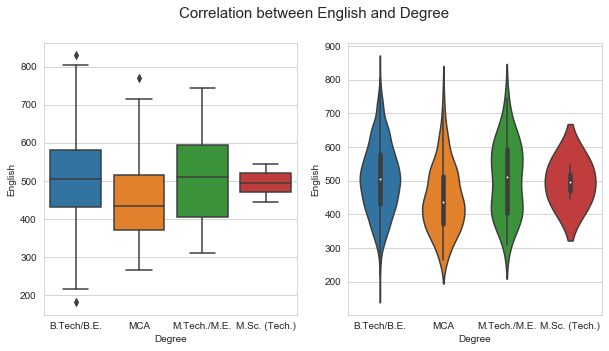

In [49]:
plt.figure(figsize=(10,5))
plt.suptitle("Correlation between English and Degree",fontsize=15)
plt.subplot(1,2,1)
sns.boxplot(x="Degree", y="English", data=df)
plt.xlabel('Degree',fontsize=10)
plt.ylabel("English",fontsize=10)
plt.subplot(1,2,2)
sns.violinplot(x="Degree", y="English", data=df)
plt.xlabel('Degree',fontsize=10)
plt.ylabel("English",fontsize=10)
plt.show()

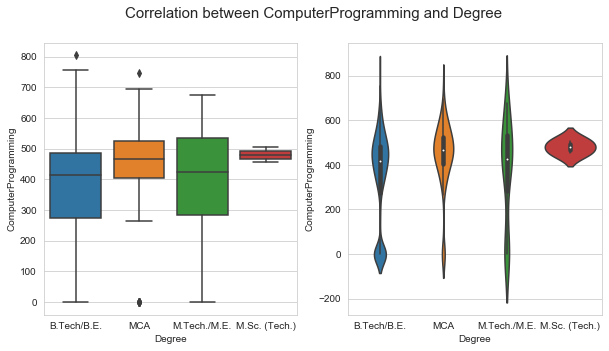

In [50]:
plt.figure(figsize=(10,5))
plt.suptitle("Correlation between ComputerProgramming and Degree",fontsize=15)
plt.subplot(1,2,1)
sns.boxplot(x="Degree", y="ComputerProgramming", data=df)
plt.xlabel('Degree',fontsize=10)
plt.ylabel("ComputerProgramming",fontsize=10)
plt.subplot(1,2,2)
sns.violinplot(x="Degree", y="ComputerProgramming", data=df)
plt.xlabel('Degree',fontsize=10)
plt.ylabel("ComputerProgramming",fontsize=10)
plt.show()

####  Correlation between features

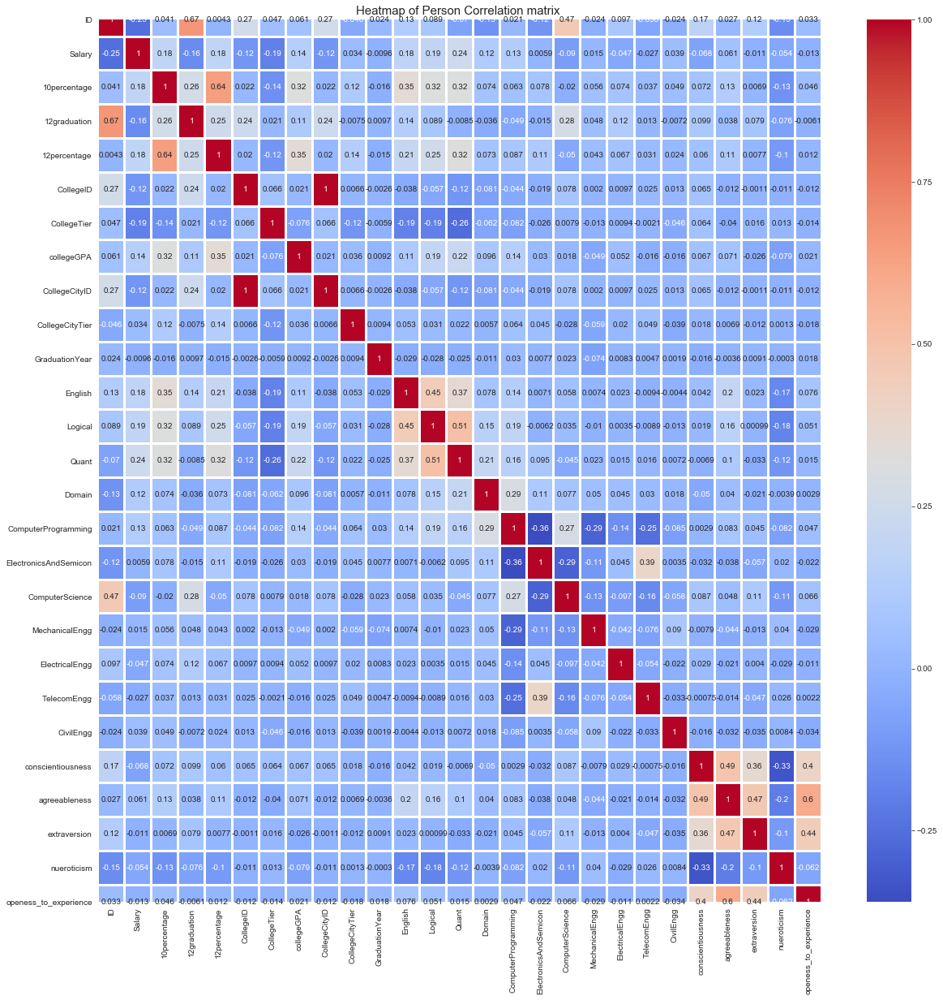

In [51]:
plt.figure(figsize=(20,20))
plt.title("Heatmap of Person Correlation matrix ",fontsize=15)
sns.heatmap(df.corr(method = 'pearson'), annot = True, cmap ='coolwarm', linewidths=2)

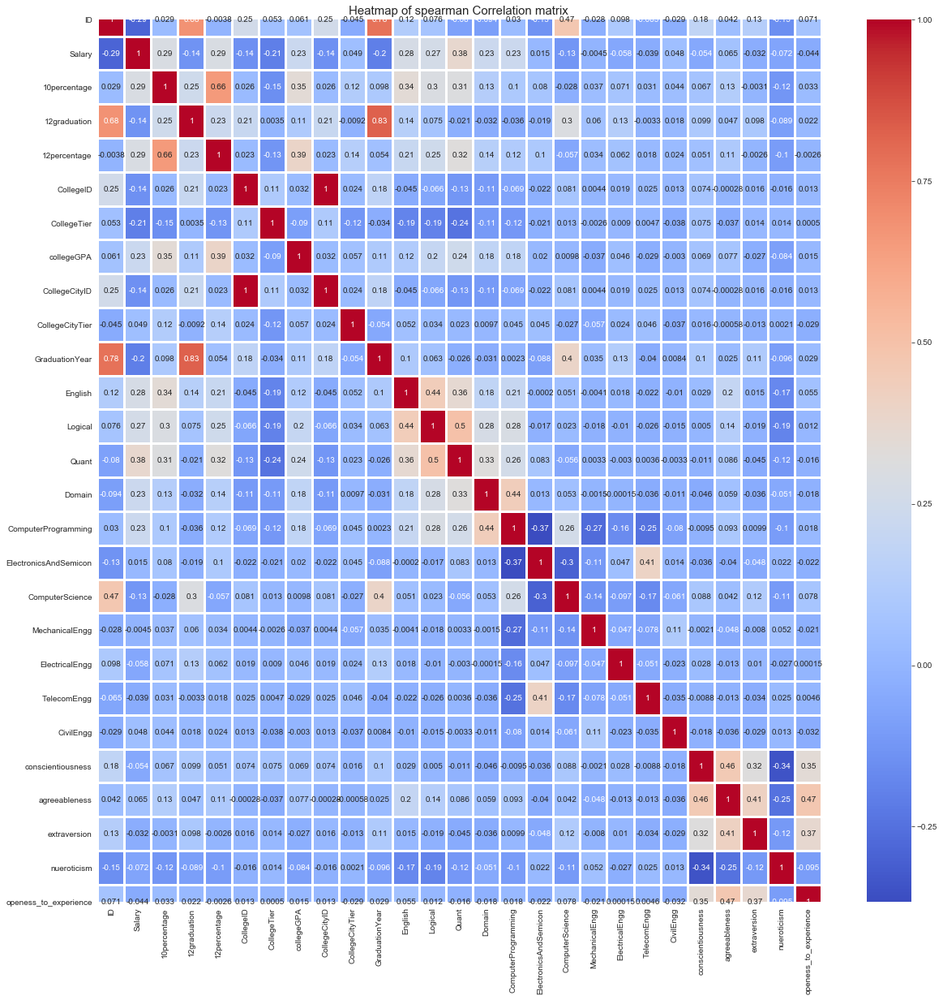

In [52]:
plt.figure(figsize=(20,20))
plt.title("Heatmap of spearman Correlation matrix ",fontsize=15)
sns.heatmap(df.corr(method = 'spearman'), annot = True, cmap ='coolwarm', linewidths=2)

### Plotting the relation between two features using Scatter plot

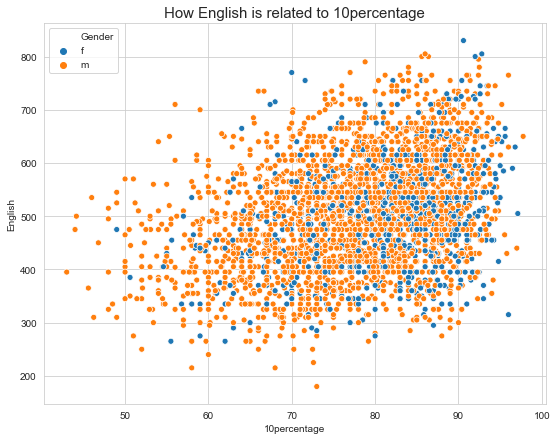

In [53]:
plt.figure(figsize=(9,7))
sns.scatterplot(y= "English",x="10percentage",data=df,markers="*",hue = "Gender")
plt.title("How English is related to 10percentage" , fontsize = 15)
plt.show()

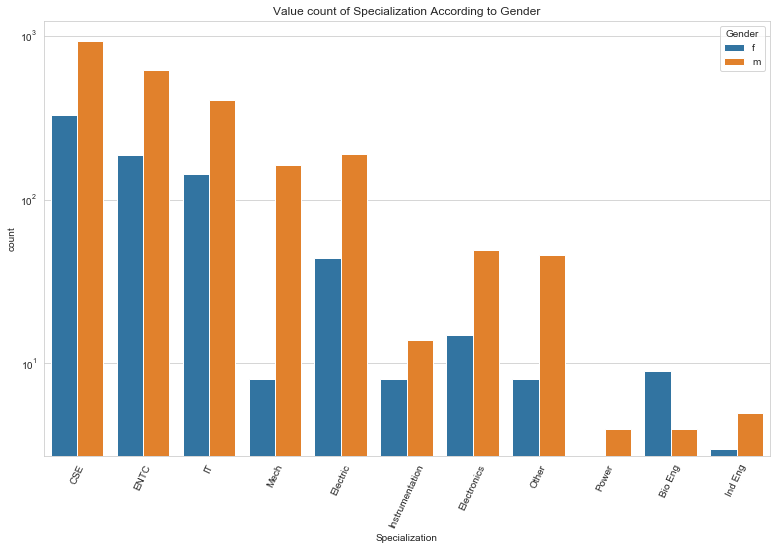

In [54]:
plt.figure(figsize = (13,8))
sns.countplot(x='Specialization',hue = "Gender", data = df,log = True)
plt.xticks(rotation=65)
plt.title("Value count of Specialization According to Gender")
plt.show()

##### According to the above observation, Gender has an effect on Specialization. 'Male' Category has Higher Specialization ratio than female category.

### Performing feature transformation

In [55]:
scaler = StandardScaler()

In [56]:
scaler_features = scaler.fit_transform(df[['Salary','10percentage','12graduation','12percentage','collegeGPA','GraduationYear','English','Logical', 'Quant', 'Domain', 'ComputerProgramming', 'ElectronicsAndSemicon',
       'ComputerScience', 'MechanicalEngg', 'ElectricalEngg', 'TelecomEngg',
       'CivilEngg', 'conscientiousness', 'agreeableness', 'extraversion',
       'nueroticism', 'openess_to_experience']])

#### Convert Categorical -> Numerical

In [57]:
df.select_dtypes(include=['object']).columns

Index(['DOL', 'Designation', 'JobCity', 'Gender', '10board', '12board',
       'Degree', 'Specialization', 'CollegeState'],
      dtype='object')

#### For Gender Feature

In [58]:
binary = {'m': 1, 'f': 0}
df['Gender'] = df['Gender'].map(binary)

#### For Designation Features

In [59]:
dummies_Designation = pd.get_dummies(df['Designation'])
dummies_Designation.head()

,.net developer,.net web developer,account executive,account manager,administrative support,android developer,application developer,application engineer,apprentice,ase,asp.net developer,assistant administrator,assistant electrical engineer,assistant engineer,assistant manager,assistant professor,assistant programmer,assistant software engineer,assistant store manager,assistant system engineer,assistant system engineer - trainee,assistant system engineer trainee,assistant systems engineer,associate engineer,associate manager,associate qa,associate software developer,associate software engg,associate software engineer,associate system engineer,associate technical operations,associate test engineer,asst. manager,automation engineer,branch manager,bss engineer,business analyst,business analyst consultant,business consultant,business development executive,business development manager,business intelligence analyst,business office manager,business process analyst,business system analyst,business systems consultant,business technology analyst,c# developer,cad designer,cad drafter,catalog associate,civil engineer,clerical,clerical assistant,client services associate,cloud engineer,computer faculty,continuous improvement engineer,controls engineer,corporate recruiter,customer care executive,customer service,customer service manager,customer service representative,customer support engineer,data analyst,data entry operator,data scientist,database administrator,database developer,db2 dba,dba,design engineer,designer,desktop support analyst,desktop support technician,developer,digital marketing specialist,documentation specialist,dotnet developer,editor,educator,electrical controls engineer,electrical design engineer,electrical designer,electrical engineer,electrical field engineer,electrical project engineer,electronic field service engineer,embedded engineer,embedded software engineer,engineer,engineer trainee,engineer- customer support,engineer-hws,engineering manager,engineering technician,enterprise solutions developer,entry level management trainee,entry level sales and marketing,etl developer,executive assistant,executive engg,executive engineer,executive hr,executive recruiter,faculty,field business development associate,field service engineer,financial analyst,financial service consultant,firmware engineer,front end developer,front end web developer,full stack developer,full-time loss prevention associate,game developer,general manager,get,gis/cad engineer,graduate apprentice trainee,graduate engineer,graduate engineer trainee,graduate trainee engineer,graphic designer,hardware engineer,help desk analyst,help desk technician,hr assistant,hr executive,hr generalist,hr manager,hr recruiter,html developer,human resource assistant,human resources analyst,human resources associate,human resources intern,implementation engineer,industrial engineer,information security analyst,information technology specialist,ios developer,it analyst,it assistant,it business analyst,it developer,it engineer,it executive,it operations associate,it recruiter,it support specialist,it technician,java developer,java software engineer,java trainee,javascript developer,jr. software developer,jr. software engineer,junior .net developer,junior engineer,junior engineer product support,junior manager,junior recruiter,junior research fellow,junior software developer,junior software engineer,junior system analyst,lecturer,lecturer & electrical maintenance,linux systems administrator,maintenance engineer,maintenance supervisor,management trainee,manager,manual tester,manufacturing engineer,marketing analyst,marketing assistant,marketing coordinator,mechanical design engineer,mechanical engineer,mobile application developer,network administrator,network engineer,network security engineer,network support engineer,office coordinator,online marketing manager,operation executive,operational excellence manager,operations,operations analyst,operations assistant,operations en

In [60]:
merged1 = pd.concat([df,dummies_Designation],axis = 'columns')
df1 = merged1.drop(['Designation','windows systems administrator'],axis = 'columns')
df1.head()

,ID,Salary,DOJ,DOL,JobCity,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,.net developer,.net web developer,account executive,account manager,administrative support,android developer,application developer,application engineer,apprentice,ase,asp.net developer,assistant administrator,assistant electrical engineer,assistant engineer,assistant manager,assistant professor,assistant programmer,assistant software engineer,assistant store manager,assistant system engineer,assistant system engineer - trainee,assistant system engineer trainee,assistant systems engineer,associate engineer,associate manager,associate qa,associate software developer,associate software engg,associate software engineer,associate system engineer,associate technical operations,associate test engineer,asst. manager,automation engineer,branch manager,bss engineer,business analyst,business analyst consultant,business consultant,business development executive,business development manager,business intelligence analyst,business office manager,business process analyst,business system analyst,business systems consultant,business technology analyst,c# developer,cad designer,cad drafter,catalog associate,civil engineer,clerical,clerical assistant,client services associate,cloud engineer,computer faculty,continuous improvement engineer,controls engineer,corporate recruiter,customer care executive,customer service,customer service manager,customer service representative,customer support engineer,data analyst,data entry operator,data scientist,database administrator,database developer,db2 dba,dba,design engineer,designer,desktop support analyst,desktop support technician,developer,digital marketing specialist,documentation specialist,dotnet developer,editor,educator,electrical controls engineer,electrical design engineer,electrical designer,electrical engineer,electrical field engineer,electrical project engineer,electronic field service engineer,embedded engineer,embedded software engineer,engineer,engineer trainee,engineer- customer support,engineer-hws,engineering manager,engineering technician,enterprise solutions developer,entry level management trainee,entry level sales and marketing,etl developer,executive assistant,executive engg,executive engineer,executive hr,executive recruiter,faculty,field business development associate,field service engineer,financial analyst,financial service consultant,firmware engineer,front end developer,front end web developer,full stack developer,full-time loss prevention associate,game developer,general manager,get,gis/cad engineer,graduate apprentice trainee,graduate engineer,graduate engineer trainee,graduate trainee engineer,graphic designer,hardware engineer,help desk analyst,help desk technician,hr assistant,hr executive,hr generalist,hr manager,hr recruiter,html developer,human resource assistant,human resources analyst,human resources associate,human resources intern,implementation engineer,industrial engineer,information security analyst,information technology specialist,ios developer,it analyst,it assistant,it business analyst,it developer,it engineer,it executive,it operations associate,it recruiter,it support specialist,it technician,java developer,java software engineer,java trainee,javascript developer,jr. software developer,jr. software engineer,junior .net developer,junior engineer,junior engineer product support,junior manager,junior recruiter,junior research fellow,junior software developer,junior software engineer,junior system analyst,lecturer,lecturer & electrical maintenance,linux systems administrator,maintenance engineer,maintenance supervisor,management trainee,manager

#### For JobCity Features

In [61]:
dummies_JobCity = pd.get_dummies(df['JobCity'])
dummies_JobCity.head()

,Delhi,Mumbai,Pune,bangalore,mumbai,"A-64,sec-64,noida",AM,Agra,Ahmedabad,Ahmedabad,Ahmednagar,Allahabad,Alwar,Ambala,Ambala City,Asansol,Asifabadbanglore,Aurangabad,Australia,BANGALORE,BANGLORE,BHUBANESWAR,Baddi HP,Bahadurgarh,Banagalore,Banaglore,Bangalore,Bangalore,Banglore,Banglore,Bankura,Bareli,Baroda,Bathinda,Beawar,Belgaum,Bellary,Bengaluru,Bhagalpur,Bharuch,Bhilai,Bhiwadi,Bhopal,Bhopal,Bhubaneshwar,Bhubaneswar,Bhubaneswar,Bhubneshwar,Bikaner,Bilaspur,Bulandshahar,Bundi,Burdwan,CHENNAI,CHEYYAR,Chandigarh,Chandigarh,Chandrapur,Chennai,Chennai,Chennai & Mumbai,"Chennai, Bangalore",Coimbatore,DELHI,Daman and Diu,Dammam,Dausa,Dehradun,Delhi,Delhi/NCR,Dhanbad,Dharamshala,Dharmapuri,Dharuhera,Dubai,Durgapur,Ernakulam,Faridabad,GREATER NOIDA,GURAGAON,GURGAON,GURGOAN,Gagret,Gajiabaad,Gandhi Nagar,Gandhinagar,Gandhinagar,Gaziabaad,Ghaziabad,Greater NOIDA,Greater Noida,Greater noida,Gulbarga,Gurga,Gurgaon,Gurgaon,Gurgoan,Gwalior,HYDERABAD,Haldia,Haridwar,Hissar,Hospete,Howrah,Hubli,Hyderabad,Hyderabad,"Indirapuram, Ghaziabad",Indore,Jabalpur,Jagdalpur,Jaipur,Jaipur,Jalandhar,Jammu,Jamnagar,Jamshedpur,Jaspur,Jeddah Saudi Arabia,Jhajjar,Jhansi,Jodhpur,Johannesburg,Joshimath,Jowai,KANPUR,KOLKATA,KOTA,"Kalmar, Sweden",Kanpur,Kanpur,Karad,Karnal,Khopoli,Kochi,Kochi/Cochin,Kolkata,Kolkata,Kolkata`,Kota,Kurnool,LONDON,LUCKNOW,Lucknow,Lucknow,Ludhiana,MEERUT,MUMBAI,Madurai,Madurai,Maharajganj,Mainpuri,Manesar,Mangalore,Meerut,"Mettur, Tamil Nadu",Miryalaguda,Mohali,Mumbai,Mumbai,Muvattupuzha,Muzaffarnagar,Muzaffarpur,Mysore,Mysore,NAVI MUMBAI,NEW DELHI,NOIDA,Nagari,Nagpur,Nagpur,Nalagarh,Nashik,Nasikcity,Navi Mumbai,"Navi Mumbai , Hyderabad",Neemrana,Nellore,New Delhi,New Delhi,New delhi,Noida,Noida,Nouda,Ongole,PATNA,PILANI,PUNE,Panchkula,Panchkula,Pantnagar,Patiala,Patna,Phagwara,Pilani,Pondicherry,Punchkula,Pune,Pune,RAE BARELI,Raipur,Rajasthan,Rajkot,Ranchi,Ratnagiri,"Rayagada, Odisha",Rewari,Rohtak,Roorkee,Rourkela,Rudrapur,"SADULPUR,RAJGARH,DISTT-CHURU,RAJASTHAN",SHAHDOL,Sahibabad,Salem,Secunderabad,Shahdol,Shimla,Siliguri,Siliguri,Sonipat,Surat,THANE,TRIVANDRUM,"Technopark, Trivandrum",Thane,Thiruvananthapuram,Tirunelvelli,Tirupathi,Tirupati,Tornagallu,Trichy,Trivandrum,Trivandrum,Udaipur,Una,Unnao,VIZAG,Vadodara,Vandavasi,Vijayawada,Visakhapatnam,Vizag,Yamuna Nagar,ahmedabad,angul,bangalore,bangalore,banglore,bengaluru,bhubaneswar,bihar,chandigarh,chennai,chennai,dehradun,delhi,ghaziabad,gurgaon,gurgoan,haryana,hderabad,hyderabad,hyderabad,hyderabad(bhadurpally),india,indore,jAipur,jaipur,jamnagar,kakinada,kala amb,kanpur,karnal,keral,kharagpur,kolkata,"kudankulam ,tarapur",latur (Maharashtra ),lucknow,manesar,meerut,mohali,mumbai,mumbai,mysore,ncr,new delhi,new delhi - jaisalmer,noida,noida,orissa,patna,pondi,pune,pune,punr,raipur,ranchi,sambalpur,sampla,shahibabad,singaruli,sonepat,thane,trivandrum,udaipur,vapi,vizag
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [62]:
merged2 = pd.concat([df1,dummies_JobCity],axis = 'columns')
df2 = merged2.drop(['JobCity','vizag'],axis = 'columns')
df2.head()

,ID,Salary,DOJ,DOL,Gender,DOB,10percentage,10board,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,.net developer,.net web developer,account executive,account manager,administrative support,android developer,application developer,application engineer,apprentice,ase,asp.net developer,assistant administrator,assistant electrical engineer,assistant engineer,assistant manager,assistant professor,assistant programmer,assistant software engineer,assistant store manager,assistant system engineer,assistant system engineer - trainee,assistant system engineer trainee,assistant systems engineer,associate engineer,associate manager,associate qa,associate software developer,associate software engg,associate software engineer,associate system engineer,associate technical operations,associate test engineer,asst. manager,automation engineer,branch manager,bss engineer,business analyst,business analyst consultant,business consultant,business development executive,business development manager,business intelligence analyst,business office manager,business process analyst,business system analyst,business systems consultant,business technology analyst,c# developer,cad designer,cad drafter,catalog associate,civil engineer,clerical,clerical assistant,client services associate,cloud engineer,computer faculty,continuous improvement engineer,controls engineer,corporate recruiter,customer care executive,customer service,customer service manager,customer service representative,customer support engineer,data analyst,data entry operator,data scientist,database administrator,database developer,db2 dba,dba,design engineer,designer,desktop support analyst,desktop support technician,developer,digital marketing specialist,documentation specialist,dotnet developer,editor,educator,electrical controls engineer,electrical design engineer,electrical designer,electrical engineer,electrical field engineer,electrical project engineer,electronic field service engineer,embedded engineer,embedded software engineer,engineer,engineer trainee,engineer- customer support,engineer-hws,engineering manager,engineering technician,enterprise solutions developer,entry level management trainee,entry level sales and marketing,etl developer,executive assistant,executive engg,executive engineer,executive hr,executive recruiter,faculty,field business development associate,field service engineer,financial analyst,financial service consultant,firmware engineer,front end developer,front end web developer,full stack developer,full-time loss prevention associate,game developer,general manager,get,gis/cad engineer,graduate apprentice trainee,graduate engineer,graduate engineer trainee,graduate trainee engineer,graphic designer,hardware engineer,help desk analyst,help desk technician,hr assistant,hr executive,hr generalist,hr manager,hr recruiter,html developer,human resource assistant,human resources analyst,human resources associate,human resources intern,implementation engineer,industrial engineer,information security analyst,information technology specialist,ios developer,it analyst,it assistant,it business analyst,it developer,it engineer,it executive,it operations associate,it recruiter,it support specialist,it technician,java developer,java software engineer,java trainee,javascript developer,jr. software developer,jr. software engineer,junior .net developer,junior engineer,junior engineer product support,junior manager,junior recruiter,junior research fellow,junior software developer,junior software engineer,junior system analyst,lecturer,lecturer & electrical maintenance,linux systems administrator,maintenance engineer,maintenance supervisor,management trainee,manager,manual 

#### For 10board   Features 

In [63]:
dummies_10board = pd.get_dummies(df['10board'])
dummies_10board.head()

,CBSE,ICSE,MatriCulation,SCC_Rajasthan,SCC_kerala,SSC,SSC_Ap,SSC_Assam,SSC_Bihar,SSC_Gujarat,SSC_Himmachal,SSC_Jharkhand,SSC_Karnataka,SSC_MP,SSC_Orissa,SSC_TN,SSC_UP,SSC_WWB,SSC_haryana,SSC_uttranchal
0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [64]:
merged3 = pd.concat([df2,dummies_10board],axis = 'columns')
df3 = merged3.drop(['10board','SSC_uttranchal'],axis = 'columns')
df3.head()

,ID,Salary,DOJ,DOL,Gender,DOB,10percentage,12graduation,12percentage,12board,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,.net developer,.net web developer,account executive,account manager,administrative support,android developer,application developer,application engineer,apprentice,ase,asp.net developer,assistant administrator,assistant electrical engineer,assistant engineer,assistant manager,assistant professor,assistant programmer,assistant software engineer,assistant store manager,assistant system engineer,assistant system engineer - trainee,assistant system engineer trainee,assistant systems engineer,associate engineer,associate manager,associate qa,associate software developer,associate software engg,associate software engineer,associate system engineer,associate technical operations,associate test engineer,asst. manager,automation engineer,branch manager,bss engineer,business analyst,business analyst consultant,business consultant,business development executive,business development manager,business intelligence analyst,business office manager,business process analyst,business system analyst,business systems consultant,business technology analyst,c# developer,cad designer,cad drafter,catalog associate,civil engineer,clerical,clerical assistant,client services associate,cloud engineer,computer faculty,continuous improvement engineer,controls engineer,corporate recruiter,customer care executive,customer service,customer service manager,customer service representative,customer support engineer,data analyst,data entry operator,data scientist,database administrator,database developer,db2 dba,dba,design engineer,designer,desktop support analyst,desktop support technician,developer,digital marketing specialist,documentation specialist,dotnet developer,editor,educator,electrical controls engineer,electrical design engineer,electrical designer,electrical engineer,electrical field engineer,electrical project engineer,electronic field service engineer,embedded engineer,embedded software engineer,engineer,engineer trainee,engineer- customer support,engineer-hws,engineering manager,engineering technician,enterprise solutions developer,entry level management trainee,entry level sales and marketing,etl developer,executive assistant,executive engg,executive engineer,executive hr,executive recruiter,faculty,field business development associate,field service engineer,financial analyst,financial service consultant,firmware engineer,front end developer,front end web developer,full stack developer,full-time loss prevention associate,game developer,general manager,get,gis/cad engineer,graduate apprentice trainee,graduate engineer,graduate engineer trainee,graduate trainee engineer,graphic designer,hardware engineer,help desk analyst,help desk technician,hr assistant,hr executive,hr generalist,hr manager,hr recruiter,html developer,human resource assistant,human resources analyst,human resources associate,human resources intern,implementation engineer,industrial engineer,information security analyst,information technology specialist,ios developer,it analyst,it assistant,it business analyst,it developer,it engineer,it executive,it operations associate,it recruiter,it support specialist,it technician,java developer,java software engineer,java trainee,javascript developer,jr. software developer,jr. software engineer,junior .net developer,junior engineer,junior engineer product support,junior manager,junior recruiter,junior research fellow,junior software developer,junior software engineer,junior system analyst,lecturer,lecturer & electrical maintenance,linux systems administrator,maintenance engineer,maintenance supervisor,management trainee,manager,manual tester,m

#### For 12board   Features

In [65]:
dummies_12board = pd.get_dummies(df['12board'])
dummies_12board.head()

,CBSE,HCC_Rajasthan,HCC_kerala,HSC,HSC_Ap,HSC_Bihar,HSC_Gujarat,HSC_Himmachal,HSC_Jharkhand,HSC_Karnataka,HSC_MP,HSC_TN,HSC_UP,HSC_haryana,HSC_uttranchal,ICSE,MatriCulation
0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [66]:
merged4 = pd.concat([df3,dummies_12board],axis = 'columns')
df4 = merged4.drop(['12board','HSC_uttranchal'],axis = 'columns')
df4.head()

,ID,Salary,DOJ,DOL,Gender,DOB,10percentage,12graduation,12percentage,CollegeID,CollegeTier,Degree,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,.net developer,.net web developer,account executive,account manager,administrative support,android developer,application developer,application engineer,apprentice,ase,asp.net developer,assistant administrator,assistant electrical engineer,assistant engineer,assistant manager,assistant professor,assistant programmer,assistant software engineer,assistant store manager,assistant system engineer,assistant system engineer - trainee,assistant system engineer trainee,assistant systems engineer,associate engineer,associate manager,associate qa,associate software developer,associate software engg,associate software engineer,associate system engineer,associate technical operations,associate test engineer,asst. manager,automation engineer,branch manager,bss engineer,business analyst,business analyst consultant,business consultant,business development executive,business development manager,business intelligence analyst,business office manager,business process analyst,business system analyst,business systems consultant,business technology analyst,c# developer,cad designer,cad drafter,catalog associate,civil engineer,clerical,clerical assistant,client services associate,cloud engineer,computer faculty,continuous improvement engineer,controls engineer,corporate recruiter,customer care executive,customer service,customer service manager,customer service representative,customer support engineer,data analyst,data entry operator,data scientist,database administrator,database developer,db2 dba,dba,design engineer,designer,desktop support analyst,desktop support technician,developer,digital marketing specialist,documentation specialist,dotnet developer,editor,educator,electrical controls engineer,electrical design engineer,electrical designer,electrical engineer,electrical field engineer,electrical project engineer,electronic field service engineer,embedded engineer,embedded software engineer,engineer,engineer trainee,engineer- customer support,engineer-hws,engineering manager,engineering technician,enterprise solutions developer,entry level management trainee,entry level sales and marketing,etl developer,executive assistant,executive engg,executive engineer,executive hr,executive recruiter,faculty,field business development associate,field service engineer,financial analyst,financial service consultant,firmware engineer,front end developer,front end web developer,full stack developer,full-time loss prevention associate,game developer,general manager,get,gis/cad engineer,graduate apprentice trainee,graduate engineer,graduate engineer trainee,graduate trainee engineer,graphic designer,hardware engineer,help desk analyst,help desk technician,hr assistant,hr executive,hr generalist,hr manager,hr recruiter,html developer,human resource assistant,human resources analyst,human resources associate,human resources intern,implementation engineer,industrial engineer,information security analyst,information technology specialist,ios developer,it analyst,it assistant,it business analyst,it developer,it engineer,it executive,it operations associate,it recruiter,it support specialist,it technician,java developer,java software engineer,java trainee,javascript developer,jr. software developer,jr. software engineer,junior .net developer,junior engineer,junior engineer product support,junior manager,junior recruiter,junior research fellow,junior software developer,junior software engineer,junior system analyst,lecturer,lecturer & electrical maintenance,linux systems administrator,maintenance engineer,maintenance supervisor,management trainee,manager,manual tester,manufactu

#### For Degree Feature

In [67]:
dummies_Degree = pd.get_dummies(df['Degree'])
dummies_Degree.head()

,B.Tech/B.E.,M.Sc. (Tech.),M.Tech./M.E.,MCA
0,1,0,0,0
1,1,0,0,0
2,1,0,0,0
3,1,0,0,0
4,1,0,0,0


In [68]:
merged5 = pd.concat([df4,dummies_Degree],axis = 'columns')
df5 = merged5.drop(['Degree','MCA'],axis = 'columns')
df5.head()

,ID,Salary,DOJ,DOL,Gender,DOB,10percentage,12graduation,12percentage,CollegeID,CollegeTier,Specialization,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,.net developer,.net web developer,account executive,account manager,administrative support,android developer,application developer,application engineer,apprentice,ase,asp.net developer,assistant administrator,assistant electrical engineer,assistant engineer,assistant manager,assistant professor,assistant programmer,assistant software engineer,assistant store manager,assistant system engineer,assistant system engineer - trainee,assistant system engineer trainee,assistant systems engineer,associate engineer,associate manager,associate qa,associate software developer,associate software engg,associate software engineer,associate system engineer,associate technical operations,associate test engineer,asst. manager,automation engineer,branch manager,bss engineer,business analyst,business analyst consultant,business consultant,business development executive,business development manager,business intelligence analyst,business office manager,business process analyst,business system analyst,business systems consultant,business technology analyst,c# developer,cad designer,cad drafter,catalog associate,civil engineer,clerical,clerical assistant,client services associate,cloud engineer,computer faculty,continuous improvement engineer,controls engineer,corporate recruiter,customer care executive,customer service,customer service manager,customer service representative,customer support engineer,data analyst,data entry operator,data scientist,database administrator,database developer,db2 dba,dba,design engineer,designer,desktop support analyst,desktop support technician,developer,digital marketing specialist,documentation specialist,dotnet developer,editor,educator,electrical controls engineer,electrical design engineer,electrical designer,electrical engineer,electrical field engineer,electrical project engineer,electronic field service engineer,embedded engineer,embedded software engineer,engineer,engineer trainee,engineer- customer support,engineer-hws,engineering manager,engineering technician,enterprise solutions developer,entry level management trainee,entry level sales and marketing,etl developer,executive assistant,executive engg,executive engineer,executive hr,executive recruiter,faculty,field business development associate,field service engineer,financial analyst,financial service consultant,firmware engineer,front end developer,front end web developer,full stack developer,full-time loss prevention associate,game developer,general manager,get,gis/cad engineer,graduate apprentice trainee,graduate engineer,graduate engineer trainee,graduate trainee engineer,graphic designer,hardware engineer,help desk analyst,help desk technician,hr assistant,hr executive,hr generalist,hr manager,hr recruiter,html developer,human resource assistant,human resources analyst,human resources associate,human resources intern,implementation engineer,industrial engineer,information security analyst,information technology specialist,ios developer,it analyst,it assistant,it business analyst,it developer,it engineer,it executive,it operations associate,it recruiter,it support specialist,it technician,java developer,java software engineer,java trainee,javascript developer,jr. software developer,jr. software engineer,junior .net developer,junior engineer,junior engineer product support,junior manager,junior recruiter,junior research fellow,junior software developer,junior software engineer,junior system analyst,lecturer,lecturer & electrical maintenance,linux systems administrator,maintenance engineer,maintenance supervisor,management trainee,manager,manual tester,manufacturing en

In [70]:
#For Specialization Feature

dummies_Specialization = pd.get_dummies(df['Specialization'])
dummies_Specialization.head()

,Bio Eng,CSE,ENTC,Electric,Electronics,IT,Ind Eng,Instrumentation,Mech,Other,Power
0,0,1,0,0,0,0,0,0,0,0,0
1,0,0,1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,1,0,0,0,0,0
3,0,1,0,0,0,0,0,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0


In [71]:
merged6 = pd.concat([df5,dummies_Specialization],axis = 'columns')
df6 = merged6.drop(['Specialization','Power'],axis = 'columns')
df6.head()

,ID,Salary,DOJ,DOL,Gender,DOB,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,CollegeState,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,.net developer,.net web developer,account executive,account manager,administrative support,android developer,application developer,application engineer,apprentice,ase,asp.net developer,assistant administrator,assistant electrical engineer,assistant engineer,assistant manager,assistant professor,assistant programmer,assistant software engineer,assistant store manager,assistant system engineer,assistant system engineer - trainee,assistant system engineer trainee,assistant systems engineer,associate engineer,associate manager,associate qa,associate software developer,associate software engg,associate software engineer,associate system engineer,associate technical operations,associate test engineer,asst. manager,automation engineer,branch manager,bss engineer,business analyst,business analyst consultant,business consultant,business development executive,business development manager,business intelligence analyst,business office manager,business process analyst,business system analyst,business systems consultant,business technology analyst,c# developer,cad designer,cad drafter,catalog associate,civil engineer,clerical,clerical assistant,client services associate,cloud engineer,computer faculty,continuous improvement engineer,controls engineer,corporate recruiter,customer care executive,customer service,customer service manager,customer service representative,customer support engineer,data analyst,data entry operator,data scientist,database administrator,database developer,db2 dba,dba,design engineer,designer,desktop support analyst,desktop support technician,developer,digital marketing specialist,documentation specialist,dotnet developer,editor,educator,electrical controls engineer,electrical design engineer,electrical designer,electrical engineer,electrical field engineer,electrical project engineer,electronic field service engineer,embedded engineer,embedded software engineer,engineer,engineer trainee,engineer- customer support,engineer-hws,engineering manager,engineering technician,enterprise solutions developer,entry level management trainee,entry level sales and marketing,etl developer,executive assistant,executive engg,executive engineer,executive hr,executive recruiter,faculty,field business development associate,field service engineer,financial analyst,financial service consultant,firmware engineer,front end developer,front end web developer,full stack developer,full-time loss prevention associate,game developer,general manager,get,gis/cad engineer,graduate apprentice trainee,graduate engineer,graduate engineer trainee,graduate trainee engineer,graphic designer,hardware engineer,help desk analyst,help desk technician,hr assistant,hr executive,hr generalist,hr manager,hr recruiter,html developer,human resource assistant,human resources analyst,human resources associate,human resources intern,implementation engineer,industrial engineer,information security analyst,information technology specialist,ios developer,it analyst,it assistant,it business analyst,it developer,it engineer,it executive,it operations associate,it recruiter,it support specialist,it technician,java developer,java software engineer,java trainee,javascript developer,jr. software developer,jr. software engineer,junior .net developer,junior engineer,junior engineer product support,junior manager,junior recruiter,junior research fellow,junior software developer,junior software engineer,junior system analyst,lecturer,lecturer & electrical maintenance,linux systems administrator,maintenance engineer,maintenance supervisor,management trainee,manager,manual tester,manufacturing engineer,marketin

#### For CollegeState Feature

In [72]:
dummies_CollegeState = pd.get_dummies(df['CollegeState'])
dummies_CollegeState.head()

,Andhra Pradesh,Assam,Bihar,Chhattisgarh,Delhi,Goa,Gujarat,Haryana,Himachal Pradesh,Jammu and Kashmir,Jharkhand,Karnataka,Kerala,Madhya Pradesh,Maharashtra,Meghalaya,Orissa,Punjab,Rajasthan,Sikkim,Tamil Nadu,Telangana,Union Territory,Uttar Pradesh,Uttarakhand,West Bengal
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [73]:
merged7 = pd.concat([df6,dummies_CollegeState],axis = 'columns')
df7 = merged7.drop(['CollegeState','Kerala'],axis = 'columns')
df7.head()

,ID,Salary,DOJ,DOL,Gender,DOB,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,GraduationYear,English,Logical,Quant,Domain,ComputerProgramming,ElectronicsAndSemicon,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience,.net developer,.net web developer,account executive,account manager,administrative support,android developer,application developer,application engineer,apprentice,ase,asp.net developer,assistant administrator,assistant electrical engineer,assistant engineer,assistant manager,assistant professor,assistant programmer,assistant software engineer,assistant store manager,assistant system engineer,assistant system engineer - trainee,assistant system engineer trainee,assistant systems engineer,associate engineer,associate manager,associate qa,associate software developer,associate software engg,associate software engineer,associate system engineer,associate technical operations,associate test engineer,asst. manager,automation engineer,branch manager,bss engineer,business analyst,business analyst consultant,business consultant,business development executive,business development manager,business intelligence analyst,business office manager,business process analyst,business system analyst,business systems consultant,business technology analyst,c# developer,cad designer,cad drafter,catalog associate,civil engineer,clerical,clerical assistant,client services associate,cloud engineer,computer faculty,continuous improvement engineer,controls engineer,corporate recruiter,customer care executive,customer service,customer service manager,customer service representative,customer support engineer,data analyst,data entry operator,data scientist,database administrator,database developer,db2 dba,dba,design engineer,designer,desktop support analyst,desktop support technician,developer,digital marketing specialist,documentation specialist,dotnet developer,editor,educator,electrical controls engineer,electrical design engineer,electrical designer,electrical engineer,electrical field engineer,electrical project engineer,electronic field service engineer,embedded engineer,embedded software engineer,engineer,engineer trainee,engineer- customer support,engineer-hws,engineering manager,engineering technician,enterprise solutions developer,entry level management trainee,entry level sales and marketing,etl developer,executive assistant,executive engg,executive engineer,executive hr,executive recruiter,faculty,field business development associate,field service engineer,financial analyst,financial service consultant,firmware engineer,front end developer,front end web developer,full stack developer,full-time loss prevention associate,game developer,general manager,get,gis/cad engineer,graduate apprentice trainee,graduate engineer,graduate engineer trainee,graduate trainee engineer,graphic designer,hardware engineer,help desk analyst,help desk technician,hr assistant,hr executive,hr generalist,hr manager,hr recruiter,html developer,human resource assistant,human resources analyst,human resources associate,human resources intern,implementation engineer,industrial engineer,information security analyst,information technology specialist,ios developer,it analyst,it assistant,it business analyst,it developer,it engineer,it executive,it operations associate,it recruiter,it support specialist,it technician,java developer,java software engineer,java trainee,javascript developer,jr. software developer,jr. software engineer,junior .net developer,junior engineer,junior engineer product support,junior manager,junior recruiter,junior research fellow,junior software developer,junior software engineer,junior system analyst,lecturer,lecturer & electrical maintenance,linux systems administrator,maintenance engineer,maintenance supervisor,management trainee,manager,manual tester,manufacturing engineer,marketing analyst,mar

In [74]:
df7.shape

(3190, 784)